#### Project Info

Team:   94

Member: Qinxi Wang

Email:  qinxiw2@illinois.edu

Github: https://github.com/QinxiW/DLH_Cervical_Cancer_Local_Explanations

Video: https://drive.google.com/file/d/1Qp-ybEQICxGYxTfFf9jYx_HAM7XHZgNO/view?usp=sharing

# Introduction
###   Background of the problem

Ayad et al discuss the importance of identifying and assessing factors that increase the risk of cervical cancer for early detection and treatment. They point out that the results from ML algorithms often are like blackbox decisions, and hard for the clinical practitioner to understand and decide if they want to follow through with the cervical cancer diagnosis in model prediction or not. This is a difficult problem because the lack of transparency not only hampers the interpretability of results, but also raises concerns about the reliability and safety of integrating machine learning into critical healthcare decision-making processe.

To address this, the authors examine various local explanation techniques aimed at elucidating a model's predictions for specific instances. The state of the art methods they used includes SHAP, TreeSHAP, LIME, DICE and other related interpretability methods.

### Paper explanation
They thus propose a framework to evaluate the quality of various explanations regarding cervical cancer risk, which involves computing different metrics to identify the most suitable explanation for assessing cervical cancer risk. In their experiments specifically, they provide empirical study analyzing the performances of different methods for explaining cervical cancer risk factors, then for each method they contextualize how various formulations of these explanations could be suitable for different patient scenarios and when they might not be appropriate, and provide recommendations to practitioners for utilizing different types of explanations in assessing and determining key factors affecting cervical cancer risk.

The innovations lies in the proposed evaluation framework for the effectiveness of each explanation techniques specifically for predicting cervical cancer risk, evaluated using RemOve And Retrain (ROAR) metrics where a number of works deem stability, consistency, compactness and faithfulness as important facets of interpretability for healthcare domains overall. The paper offers a critical analysis of existing local interpretability methods for explaining cervical cancer risk factors, aiming to assist clinicians in choosing appropriate explanations for different patient contexts. The approach also have application contribution, as it enables selecting the suitable explanations to reason about cervical cancer diagnosis and can be extended to other healthcare applications and areas where explanation is critical, and paved the future work for a user study with clinicians to assess how features weighted sums may lead to context-specific explanations.

# Scope of Reproducibility:

The paper draws the following conclusions from the experiments. We wonder if we can first reproduce, and then test if the hypotheses are valid:

1.   All explainers agree on HPV being the most important risk factor for cervical cancer.
2.   SHAP(SHapley Additive exPlanations) explainers have exactly the same top 10 most important features for Patient 1.
3.   The most unstable explainers are those that depend on creating local neighborhoods
4.   No single explanation performs optimally across patients and metrics
5.   The top 30% important features given by TreeSHAP have the most impact on model learning.
6.   LIME(Local Interpretable Model-Agnostic Explanations) is the most stable, most robust to removal of features, and SHAP the most consistent in terms of feature and rank agreements.

We hope to test these hypotheses by repeat the process the authors have done in the paper, where we will first generate and compare the quality of each of the local explanation techniques, we will then examine the top features produced by each of the techniques, and assess the decrease in accuracy of models when successively removing a fraction of the top features for each explanation and see if the above hold. The paper came with various results, which we will also cover in the later section; for illustration purpose, the scope of reproducibility will be focused on Features and Methods -

In [267]:
import gdown
im1_url = 'https://drive.google.com/file/d/1zL-wxxPcY84t0ape_XX-yGVthttv7drQ/view?usp=drive_link'
output1 = "features.png"
gdown.download(im1_url, output1, fuzzy=True)

im2_url = 'https://drive.google.com/file/d/1--32U-RBk9zLsqj1yLNA4zCCaQ76ntya/view?usp=drive_link'
output2 = "methods.png"
gdown.download(im2_url, output2, fuzzy=True)


Downloading...
From: https://drive.google.com/uc?id=1zL-wxxPcY84t0ape_XX-yGVthttv7drQ
To: /content/features.png
100%|██████████| 293k/293k [00:00<00:00, 69.4MB/s]
Downloading...
From: https://drive.google.com/uc?id=1--32U-RBk9zLsqj1yLNA4zCCaQ76ntya
To: /content/methods.png
100%|██████████| 351k/351k [00:00<00:00, 66.9MB/s]


'methods.png'

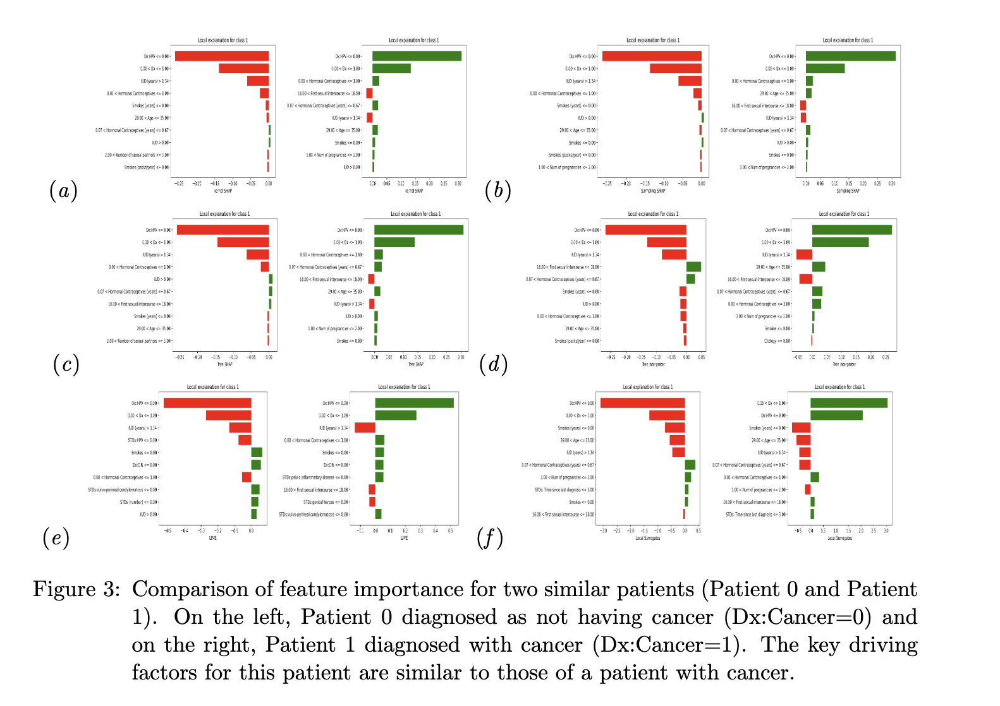

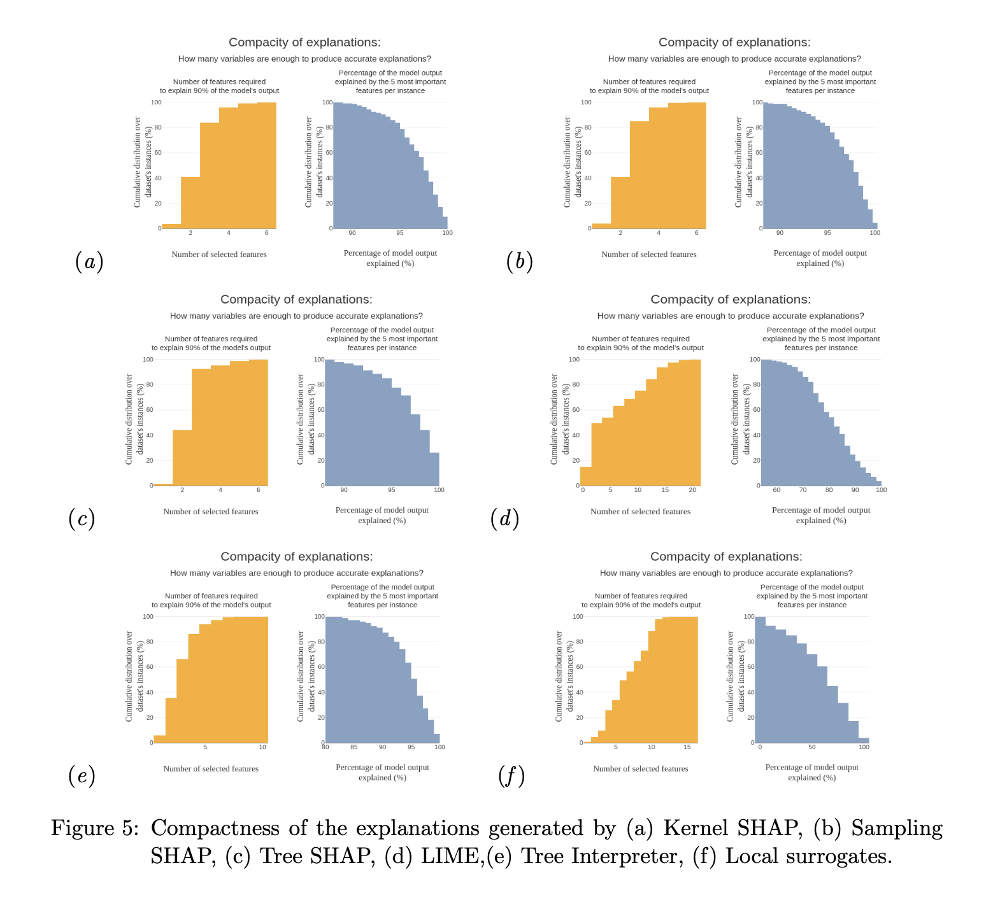

In [26]:
import cv2
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt
img = cv2.imread(output1)
img2 = cv2.imread(output2)

cv2_imshow(img)
cv2_imshow(img2)

# Methodology

This is the core part of the project draft. Here we will go over four subsections **data**, **model**, **training** and **evaluation** in our experiment and analysis work so far.

In [257]:
# !pip3 freeze > requirements.txt

In [27]:
!python --version

Python 3.10.12


## Environment

In this notebook we use Python version of 3.10.12.


Dependencies/packages needed are the following, you can uncomment and run via pip install. They are also freezed to requirement.txt at https://github.com/QinxiW/DLH_Cervical_Cancer_Local_Explanations/blob/main/requirements.txt.


In [57]:
# !pip install shap
# !pip install lime
# !pip install interpret-community
# !pip install alibi
# !pip install treeinterpreter
# !pip install SALib
# !pip install dice-ml
# !pip install spectralcluster
# !pip install -U kaleido
# !pip install gdown
# !pip install shapash

In [2]:
import pandas as pd
import seaborn as sns
import numpy as np
from numpy import arange
import itertools
import random

import matplotlib.pyplot as plt
# from matplotlib import pyplot as plt

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from plotly.offline import plot, iplot, init_notebook_mode
from typing import List
from scipy.stats import spearmanr, bernoulli

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import RobustScaler,StandardScaler, normalize
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold, cross_val_score,  StratifiedShuffleSplit
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.metrics import precision_recall_fscore_support, roc_auc_score, accuracy_score,confusion_matrix
from sklearn.inspection import permutation_importance, PartialDependenceDisplay, partial_dependence

from imblearn.over_sampling import SMOTE, ADASYN, RandomOverSampler

from interpret_community.mimic.mimic_explainer import MimicExplainer
from interpret_community.mimic.models import LinearExplainableModel
from interpret.blackbox import MorrisSensitivity

import shap
import lime
from lime import lime_tabular
from treeinterpreter import treeinterpreter as ti
import dice_ml

import warnings
warnings.filterwarnings('ignore')

##  Data

The dataset comes with 36 columns and 859 rows. Among them we have 858 patients and 35 features, including demographic information such as age and number of pregnancies, clinical tests such as Hinselmann and Citology, sexually transmitted diseases such as HPV and AIDS, and diagnosis taken by the patients such as HPV and CIN. All the data formats in the dataset are numbers or string, and all structured data, so from a data size perspective the memory and computation needed for working with is feasible.

  * Source of the data:
  
  The dataset used in the paper is available from the UCI repository (Fernandes et al., 2017). It is open source, and also available on Kaggle which we could access and download directly at https://www.kaggle.com/datasets/loveall/cervical-cancer-risk-classification?resource=download
  
  * Statistics:
  
  Here are the high-level subtopics we will cover in the code snippets below.

  1. ovreview of unique values of each column
  2. data distribution analysis, in the order of: top features correlated with cancer, Pregnancy Distribution by Age, Correlation of diagnoses,
  3. more in-depth data analysis, including number of sex partner by age buckets created, Proportions of women who have Cervical Cancer / HPV, Hormonal Contraceptives and Cervical Cancer.


  * Data process:

  Here are the high-level subtopics we will cover in the code snippets below.

  1. convert all features to numeric column types if they are not already
  2. bucket ages into 8 categories from "Child" to "70+"
  3. aggregating various different std columns into a "total_std" new col.
  4. dealing with imbalanced data
  5. create train/test dataset for later training and evaluation

  
  * Illustration:
  
  We will be printing results, plotting figures for illustration for each of the sub-Statistics and Data processing in order below.

### Data download instruction

The source data is open source, and also available on Kaggle which we could access and download directly at https://www.kaggle.com/datasets/loveall/cervical-cancer-risk-classification?resource=download

you can also directly load the dataset into the notebook with gdown, and run the following code block.

In [3]:
import gdown
url = 'https://drive.google.com/file/d/1lfmBWeWp9L0RgKYqySnyWsm3ryfceLnN/view?usp=sharing'
output = "kag_risk_factors_cervical_cancer.csv"
gdown.download(url, output, fuzzy=True)

Downloading...
From: https://drive.google.com/uc?id=1lfmBWeWp9L0RgKYqySnyWsm3ryfceLnN
To: /content/kag_risk_factors_cervical_cancer.csv
100%|██████████| 102k/102k [00:00<00:00, 54.2MB/s]


'kag_risk_factors_cervical_cancer.csv'

### Statistics

In [4]:
# load dataframe
risk_factor_df = pd.read_csv(output, delimiter=',', encoding='utf-8', engine='python')
risk_factor_df.head()

,Age,Number of sexual partners,First sexual intercourse,Num of pregnancies,Smokes,Smokes (years),Smokes (packs/year),Hormonal Contraceptives,Hormonal Contraceptives (years),IUD,...,STDs: Time since first diagnosis,STDs: Time since last diagnosis,Dx:Cancer,Dx:CIN,Dx:HPV,Dx,Hinselmann,Schiller,Citology,Biopsy
0,18,4.0,15.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,?,?,0,0,0,0,0,0,0,0
1,15,1.0,14.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,?,?,0,0,0,0,0,0,0,0
2,34,1.0,?,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,?,?,0,0,0,0,0,0,0,0
3,52,5.0,16.0,4.0,1.0,37.0,37.0,1.0,3.0,0.0,...,?,?,1,0,1,0,0,0,0,0
4,46,3.0,21.0,4.0,0.0,0.0,0.0,1.0,15.0,0.0,...,?,?,0,0,0,0,0,0,0,0


In [5]:
# calculate statistics
def calculate_stats(raw_data):
  # implement this function to calculate the statistics
  # it is encouraged to print out the results
  return None

# process raw data
def process_data(raw_data):
    # implement this function to process the data as you need
  return None

# processed_data = process_data(raw_data)

''' you can load the processed data directly
processed_data_dir = '/content/gdrive/My Drive/Colab Notebooks/<path-to-raw-data>'
def load_processed_data(raw_data_dir):
  pass

'''
def print_unique_values_df(df: pd.DataFrame):
    for col in list(df):
        print("Unique Values for "'{}'":{}".format(str(col), risk_factor_df[col].unique()))
        print("dtype for {} is :{}".format(str(col), risk_factor_df[col].dtypes))
        print("-" * 150)


def print_unique_values_for_col(df: pd.DataFrame, col_names: List[str] = None):
    for col in col_names:
        print("Unique Values for "'{}'":{}".format(str(col), risk_factor_df[col].unique()))

print_unique_values_df(risk_factor_df)

Unique Values for Age:[18 15 34 52 46 42 51 26 45 44 27 43 40 41 39 37 38 36 35 33 31 32 30 23
 28 29 20 25 21 24 22 48 19 17 16 14 59 79 84 47 13 70 50 49]
dtype for Age is :int64
------------------------------------------------------------------------------------------------------------------------------------------------------
Unique Values for Number of sexual partners:['4.0' '1.0' '5.0' '3.0' '2.0' '6.0' '?' '7.0' '15.0' '8.0' '10.0' '28.0'
 '9.0']
dtype for Number of sexual partners is :object
------------------------------------------------------------------------------------------------------------------------------------------------------
Unique Values for First sexual intercourse:['15.0' '14.0' '?' '16.0' '21.0' '23.0' '17.0' '26.0' '20.0' '25.0' '18.0'
 '27.0' '19.0' '24.0' '32.0' '13.0' '29.0' '11.0' '12.0' '22.0' '28.0'
 '10.0']
dtype for First sexual intercourse is :object
----------------------------------------------------------------------------------------------------

In [35]:
# 840 non HPV, 18 HPV

risk_factor_df[risk_factor_df['Dx:HPV'] == 1]
risk_factor_df['Dx:HPV'].value_counts()

Dx:HPV
0    840
1     18
Name: count, dtype: int64

In [36]:
# no nulls
risk_factor_df.isna().sum()

Age                                   0
Number of sexual partners             0
First sexual intercourse              0
Num of pregnancies                    0
Smokes                                0
Smokes (years)                        0
Smokes (packs/year)                   0
Hormonal Contraceptives               0
Hormonal Contraceptives (years)       0
IUD                                   0
IUD (years)                           0
STDs                                  0
STDs (number)                         0
STDs:condylomatosis                   0
STDs:cervical condylomatosis          0
STDs:vaginal condylomatosis           0
STDs:vulvo-perineal condylomatosis    0
STDs:syphilis                         0
STDs:pelvic inflammatory disease      0
STDs:genital herpes                   0
STDs:molluscum contagiosum            0
STDs:AIDS                             0
STDs:HIV                              0
STDs:Hepatitis B                      0
STDs:HPV                              0


In [37]:
risk_factor_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 858 entries, 0 to 857
Data columns (total 36 columns):
 #   Column                              Non-Null Count  Dtype 
---  ------                              --------------  ----- 
 0   Age                                 858 non-null    int64 
 1   Number of sexual partners           858 non-null    object
 2   First sexual intercourse            858 non-null    object
 3   Num of pregnancies                  858 non-null    object
 4   Smokes                              858 non-null    object
 5   Smokes (years)                      858 non-null    object
 6   Smokes (packs/year)                 858 non-null    object
 7   Hormonal Contraceptives             858 non-null    object
 8   Hormonal Contraceptives (years)     858 non-null    object
 9   IUD                                 858 non-null    object
 10  IUD (years)                         858 non-null    object
 11  STDs                                858 non-null    object

In [38]:
risk_factor_df.describe()

,Age,STDs: Number of diagnosis,Dx:Cancer,Dx:CIN,Dx:HPV,Dx,Hinselmann,Schiller,Citology,Biopsy
count,858.000000,858.000000,858.000000,858.000000,858.000000,858.000000,858.000000,858.000000,858.000000,858.000000
mean,26.820513,0.087413,0.020979,0.010490,0.020979,0.027972,0.040793,0.086247,0.051282,0.064103
std,8.497948,0.302545,0.143398,0.101939,0.143398,0.164989,0.197925,0.280892,0.220701,0.245078
min,13.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,20.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,84.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### Data Processing

In [6]:
#these columns are not of type object, but are of type numeric
cols_to_convert = ['Number of sexual partners', 'First sexual intercourse', 'Num of pregnancies', 'Smokes',
                   'Smokes (years)', 'Smokes (packs/year)', 'Hormonal Contraceptives',
                   'Hormonal Contraceptives (years)', 'IUD', 'IUD (years)', 'STDs', 'STDs (number)',
                   'STDs:condylomatosis', 'STDs:cervical condylomatosis', 'STDs:vaginal condylomatosis',
                   'STDs:vulvo-perineal condylomatosis', 'STDs:syphilis', 'STDs:pelvic inflammatory disease',
                   'STDs:genital herpes', 'STDs:molluscum contagiosum', 'STDs:AIDS', 'STDs:HIV', 'STDs:Hepatitis B',
                   'STDs:HPV', 'STDs: Time since first diagnosis',
                   'STDs: Time since last diagnosis']

risk_factor_df[cols_to_convert] = risk_factor_df[cols_to_convert].apply(pd.to_numeric, errors="coerce")
risk_factor_df[cols_to_convert].fillna(np.nan, inplace=True)
imp = SimpleImputer(strategy="median")
X = imp.fit_transform(risk_factor_df)
risk_factor_df = pd.DataFrame(X, columns=list(risk_factor_df.columns))


In [7]:
def age_cat(age):
    if age < 12:
        return "Child"
    elif age < 20:
        return "Teen"
    elif age < 30:
        return "20's"
    elif age < 40:
        return "30's"
    elif age < 50:
        return "40's"
    elif age < 60:
        return "50's"
    elif age < 70:
        return "60's"
    else:
        return "70+"


risk_factor_df["Age"] = risk_factor_df["Age"].astype(int)
risk_factor_df["age_cat"] = risk_factor_df["Age"].apply(age_cat)

In [8]:
std_cols = {'STDs:condylomatosis',
            'STDs:cervical condylomatosis',
            'STDs:vaginal condylomatosis',
            'STDs:vulvo-perineal condylomatosis',
            'STDs:syphilis',
            'STDs:pelvic inflammatory disease',
            'STDs:genital herpes',
            'STDs:molluscum contagiosum',
            'STDs:AIDS',
            'STDs:HIV',
            'STDs:Hepatitis B',
            'STDs:HPV'}

risk_factor_df["total_std"] = risk_factor_df[list(std_cols)].sum(axis=1)
std_agg = risk_factor_df.groupby("age_cat", as_index=False)[list(std_cols)].sum()

test_cols = ["Hinselmann", "Schiller", "Citology", "Biopsy"]
risk_factor_df["total_tests"] = risk_factor_df[test_cols].sum(axis = 1)

to_int_and_beyond = {"total_tests",
                     "total_std",
                     "Smokes",
                     "Biopsy",
                     "Dx:Cancer",
                     "Num of pregnancies",
                     "Number of sexual partners",
                     "First sexual intercourse",
                     "Hormonal Contraceptives",
                     "IUD",
                     "STDs",
                     "STDs (number)",
                     "STDs: Number of diagnosis",
                     "Dx:CIN",
                     "Dx:HPV",
                     "Dx",
                     "Hinselmann",
                     "Schiller",
                     "Biopsy",
                     "Citology"}

to_int_and_beyond = to_int_and_beyond.union(std_cols)

for col in to_int_and_beyond:
    risk_factor_df[col] = risk_factor_df[col].astype(int)


### Data Analysis

In [42]:
n = 7
target = label = "Dx:Cancer"
corr = risk_factor_df.select_dtypes(include=np.number).corr()

x = corr.nlargest(n,target).index
corr_df =  risk_factor_df[list(x)]
corr = corr_df.corr()
fig = px.imshow(corr,color_continuous_scale = "PuBu")
fig.update_layout(title="Top "+str(n)+" Features Correlated With "+str(target).capitalize())
fig.show()


In [43]:
def stats(x):
    temp1=(df[[x,label]].value_counts(normalize=True).round(decimals=3)*100).reset_index().rename(columns={0:'Overall_Percent'})
    Coloumn_To_Aggregate=[x,label]
    df6=pd.merge(df.groupby(Coloumn_To_Aggregate).size().reset_index(name='ind_siz'),
                 df.groupby(Coloumn_To_Aggregate[:-1]).size().reset_index(name='Total'), on =Coloumn_To_Aggregate[:-1])
    df6['Category_Percent']=round((df6['ind_siz']/df6['Total'])*100 ,2)
    temp2=df6[[x,label,'Category_Percent']]
    temp3=temp1.merge(temp2,on=[x,label])
    return temp3.pivot(columns=x,index=label)

df=risk_factor_df
label='age_cat'

stats('Dx:Cancer')


proportion      Category_Percent       
Dx:Cancer          0    1                0      1
age_cat                                          
20's            45.3  0.6            46.31  27.78
30's            24.7  0.9            25.24  44.44
40's             6.2  0.3             6.31  16.67
50's             0.5  0.1             0.48   5.56
70+              0.5  NaN             0.48    NaN
Teen            20.7  0.1            21.19   5.56

In [44]:
age_dist = px.histogram(risk_factor_df, x="Age", marginal="box", color_discrete_sequence=["palevioletred"])
age_dist.update_layout(title="Age distribution")
age_dist.show()

In [45]:
age_preg_bar = px.box(risk_factor_df.sort_values(by="Age",ascending=True), x="age_cat", y="Num of pregnancies",
                      color_discrete_sequence=["darkblue"], points="outliers",
                      category_orders=["Teenager", "Twenties", "Thirties", "Forties", "Fifties","Sixties",
                                       "Seventy and over"])
age_preg_bar.update_xaxes(title="Age Category")
age_preg_bar.update_yaxes(title="Number of Pregnancies")
age_preg_bar.update_layout(title="Distribution of number of pregnancies per age group")
age_preg_bar.show()


In [46]:
age_num_sex_partners = px.box(risk_factor_df.sort_values(by="Age",ascending=True), x="age_cat", y="Number of sexual partners",
                      color_discrete_sequence=["blue"], points="outliers",
                      category_orders=["Teenager", "Twenties", "Thirties", "Forties", "Fifties",
                                       "Seventy and over"])
age_num_sex_partners.update_xaxes(title="Age Category")
age_num_sex_partners.update_yaxes(title="Number of Sexual Partners")
age_num_sex_partners.update_layout(title="Distribution of number of sexual partners per age group")
age_num_sex_partners.show()


In [47]:
age_num_sex_partners = px.scatter(risk_factor_df, x="Age",
                                  y="Number of sexual partners",
                                  trendline="ols",
                                  opacity=0.4,
                                  color="Num of pregnancies",
                                  color_continuous_scale="rdbu",)
age_num_sex_partners.update_layout(title="Age vs Number of Sexual Partners")
age_num_sex_partners.show()


In [49]:
label = 'Number of sexual partners'
diagnoses_cols = [label,
                  'Dx:CIN',
                  'Dx:HPV']
diagnoses_corr_matrix = risk_factor_df[diagnoses_cols].corr()

diagnoses_heatmap = px.imshow(diagnoses_corr_matrix, aspect="auto", color_continuous_scale="tealgrn", text_auto=True)
diagnoses_heatmap.show()


In [50]:
fig = px.histogram(std_agg, x="age_cat", y=list(std_cols), barmode="group", histfunc="sum")
fig.update_layout(title="Sum of STD occurence across age categories")
fig.update_xaxes(title="Age Category")
fig.update_yaxes(title="Sum")
fig.show()

In [51]:
age_num_sex_partners = px.box(risk_factor_df.sort_values(by="Age",ascending=True), x="age_cat", y="total_std",
                      color_discrete_sequence=["blue"], points="outliers",
                      category_orders=["Teenager", "Twenties", "Thirties", "Forties", "Fifties", "Seventy and over"])
age_num_sex_partners.update_xaxes(title="Age Category")
age_num_sex_partners.update_yaxes(title="Number of Sexual Partners")
age_num_sex_partners.update_layout(title="Distribution of number of sexual partners per age group")
age_num_sex_partners.show()

In [52]:
fig = px.histogram(risk_factor_df.query("total_std>=0").sort_values(by=["total_std", label], ascending=True),
                   x="age_cat",
                   facet_col="total_std",
                   facet_row=label,
                   color_discrete_sequence=["rebeccapurple"],
                   opacity=0.7)
fig.update_layout(title="Count of women across age groups who have had one or more std")
fig.show()

In [53]:
fig = px.histogram(risk_factor_df.query("total_std>=0").sort_values(by=["total_std","Dx:HPV"], ascending=True),
                   x="age_cat",
                   facet_col="total_std",
                   facet_row="Dx:HPV",
                   color_discrete_sequence=["dodgerblue"],
                   opacity=0.7)
fig.update_layout(title="Count of women across age groups who have had one or more std")
fig.show()

In [54]:
fig = px.histogram(risk_factor_df.query("total_tests>0").sort_values(by="total_tests", ascending=True),
                   x="age_cat",
                   facet_col="total_tests",
                   facet_row=label,
                   color_discrete_sequence=["blueviolet"],
                   opacity=0.8)
fig.update_layout(title="Count of women across age groups who have had one or more test")
fig.show()

In [55]:
fig = px.histogram(risk_factor_df.query("total_tests>0").sort_values(by=["total_tests","Dx:HPV"], ascending=True),
                   x="age_cat",
                   facet_col="total_tests",
                   facet_row="Dx:HPV",
                   color_discrete_sequence=["coral"],
                   opacity=0.8)
fig.update_layout(title="Count of women across age groups who have had one or more test")
fig.show()

In [56]:
fig = px.ecdf(risk_factor_df, x=["Smokes (years)",
                                 "Hormonal Contraceptives (years)",
                                 "IUD (years)"],
              color_discrete_sequence=["crimson", "deepskyblue", "chartreuse"])
fig.update_xaxes(title="Years")
fig.update_layout(title="ECDF Plot")
fig.show()

In [57]:
age_category_range = {
    "Age<12": "Child",
    "Age>=12 & Age<20": "Teen",
    "Age>=20 & Age<30": "20's",
    "Age>=30 & Age<40": "30's",
    "Age>=40 & Age<50": "40's",
    "Age>=50 & Age<60": "50's",
    "Age>=60 & Age<70": "60's",
    "Age>=70": "70+"}
age_prop_dict = {}
col = "Age"
for age_range, category in age_category_range.items():
    age_prop_dict[category] = risk_factor_df.query(age_range)[col].count() / len(risk_factor_df)

proportion_samples_df = pd.DataFrame.from_dict(age_prop_dict, orient="index",
                                               columns=[ "Sample Proportion"])
proportion_samples_df = proportion_samples_df.reset_index()
proportion_samples_df.columns = proportion_samples_df.columns.str.replace("index","Category")
fig = px.pie(proportion_samples_df,
             values='Sample Proportion',
             names="Category",
             title='Age Category proportion of women sampled',color_discrete_sequence=px.colors.sequential.RdBu)
fig.show()
proportion_samples_df


,Category,Sample Proportion
0,Child,0.000000
1,Teen,0.208625
2,20's,0.459207
3,30's,0.256410
4,40's,0.065268
5,50's,0.005828
6,60's,0.000000
7,70+,0.004662


In [58]:
fig = make_subplots(rows=1, cols=2, specs=[[{'type': 'domain'}, {'type': 'domain'}]], subplot_titles=["Cancer", "HPV"])
fig.add_trace(go.Pie(labels=risk_factor_df["age_cat"], values=risk_factor_df[label], name="Cancer", marker_colors=px.colors.sequential.RdBu), 1, 1)
fig.add_trace(go.Pie(labels=risk_factor_df["age_cat"], values=risk_factor_df["Dx:HPV"], name="HPV", marker_colors=px.colors.sequential.RdBu), 1, 2)

fig.update_traces(hole=.0, hoverinfo="label+percent+name")
fig.update_layout(title_text="Proportion of women across age categories with a diagnosis of Cancer, HPV")
fig.show()

In [59]:
df_hormonal_compariosn = risk_factor_df.groupby(["age_cat"], as_index=False)[["IUD", "Hormonal Contraceptives"]].sum()
fig = px.histogram(df_hormonal_compariosn, x="age_cat", y=["IUD", "Hormonal Contraceptives"], barmode="group", color_discrete_sequence=["darkcyan", "mediumorchid"])

fig.update_xaxes(title="Age Category")
fig.update_yaxes(title="Count")
fig.update_layout(title="Age Ranges of women who use Contraceptives")

fig.show()

In [60]:
df_hormonal_contraceptives = risk_factor_df[(risk_factor_df["Hormonal Contraceptives"] == 1) & (risk_factor_df["IUD"] == 0)]
df_hormonal_contraceptives = df_hormonal_contraceptives.sort_values(by=["Smokes", label])

fig = px.histogram(df_hormonal_contraceptives, x="age_cat", color="Smokes", barmode="group", facet_col=label, color_discrete_sequence=["darkcyan", "crimson"])
fig.update_xaxes(title="Age Category")
fig.update_yaxes(title="Count")
fig.update_layout(title="Age Ranges of women who use Hormonal Contraceptives")
fig.show()

In [61]:
df_IUD_contraceptives = risk_factor_df[(risk_factor_df["Hormonal Contraceptives"] == 0) & (risk_factor_df["IUD"] == 1)]
df_IUD_contraceptives = df_IUD_contraceptives.sort_values(by=["Smokes", label], ascending=True)
fig = px.histogram(df_IUD_contraceptives, x="age_cat", color="Smokes", barmode="group", facet_col=label, color_discrete_sequence=["darkcyan", "crimson"])

fig.update_xaxes(title="Age Category")
fig.update_yaxes(title="Sum of IUD Usage across age category")
fig.update_layout(title="Age Ranges of women who use IUD's")
fig.show()

In [62]:
df_both_contraceptives = risk_factor_df[(risk_factor_df["Hormonal Contraceptives"] == 1) & (risk_factor_df["IUD"] == 1)]
df_both_contraceptives = df_both_contraceptives.sort_values(by="Smokes")
fig = px.histogram(df_both_contraceptives, x="age_cat", color="Smokes", barmode="group", facet_col=label, color_discrete_sequence=["darkcyan", "crimson"])
fig.update_xaxes(title="Age Category")
fig.update_yaxes(title="Count")
fig.update_layout(title="Age Ranges of women who use BOTH Hormonal Contracepties and IUD's")
fig.show()


### Test / Train Split

In [10]:
test = risk_factor_df[['Number of sexual partners',	'First sexual intercourse',	'Num of pregnancies',	'Smokes','Dx','Hormonal Contraceptives', 'total_std', 'total_tests', 'age_cat']].groupby('age_cat').mean()
test.round(2)

,Number of sexual partners,First sexual intercourse,Num of pregnancies,Smokes,Dx,Hormonal Contraceptives,total_std,total_tests
age_cat,,,,,,,,
20's,2.54,17.01,2.10,0.14,0.03,0.72,0.14,0.24
30's,2.67,18.09,2.83,0.17,0.04,0.75,0.15,0.26
40's,2.50,18.59,3.29,0.07,0.05,0.68,0.23,0.27
50's,2.80,16.40,4.80,0.40,0.20,0.40,0.00,1.00
70+,2.50,19.75,7.25,0.50,0.00,0.00,0.00,0.25
Teen,2.25,15.08,1.40,0.11,0.01,0.56,0.18,0.20


In [11]:
label="Dx:Cancer"
dx_cancer = px.histogram(risk_factor_df, y=label)
dx_cancer.update_layout(bargap=0.2)
dx_cancer.update_layout(title = "Imbalanced Classes")
dx_cancer.show()

X = risk_factor_df.drop([label, "age_cat"], axis=1)
y = risk_factor_df[label].copy()

In [39]:
adasyn = ADASYN(random_state=42)
x_adasyn,y_adasyn = adasyn.fit_resample(X,y)
risk_factor_df = x_adasyn.join(y_adasyn)
risk_factor_df["age_cat"] = risk_factor_df["Age"].apply(age_cat)

dx_cancer = px.histogram(risk_factor_df, y=label)
dx_cancer.update_layout(bargap=0.2)
dx_cancer.update_layout(title = "Balanced Classes")
dx_cancer.show()

In [40]:
train_set = None
test_set = None
split = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
for train_idx, test_idx in split.split(risk_factor_df, risk_factor_df["age_cat"]):
    train_set = risk_factor_df.loc[train_idx]
    test_set = risk_factor_df.loc[test_idx]
cols_to_drop = ["age_cat","total_std","total_tests"]
for set_ in (train_set, test_set):
    for col in cols_to_drop:
        set_.drop(col, axis=1, inplace=True)

In [41]:
X_train = train_set.drop(label, axis=1)
y_train = train_set[label].copy()

X_test = test_set.drop(label, axis=1)
y_test = test_set[label].copy()

X_test.reset_index(drop=True, inplace=True)
y_test.reset_index(drop=True, inplace=True)
X_train.reset_index(drop=True, inplace=True)
y_train.reset_index(drop=True, inplace=True)

len(X_test.columns)

35

In [68]:
# ## saving the data into csv for reuse
# # Without random var
# X_test.to_csv('/content/drive/My Drive/X_test.csv')
# y_test.to_csv('/content/drive/My Drive/y_test.csv')
# X_train.to_csv('/content/drive/My Drive/X_train.csv')
# y_train.to_csv('/content/drive/My Drive/y_train.csv')

# # With random var
# # Binary
# X_test.to_csv('/content/drive/My Drive/RX_test2.csv')
# y_test.to_csv('/content/drive/My Drive/Ry_test2.csv')
# X_train.to_csv('/content/drive/My Drive/RX_train2.csv')
# y_train.to_csv('/content/drive/My Drive/Ry_train2.csv')

# # Continuous
# X_test.to_csv('/content/drive/My Drive/RX_test.csv')
# y_test.to_csv('/content/drive/My Drive/Ry_test.csv')
# X_train.to_csv('/content/drive/My Drive/RX_train.csv')
# y_train.to_csv('/content/drive/My Drive/Ry_train.csv')

In [42]:
# adding a noise to the data
X_test['VARB']=bernoulli.rvs(.5, size=X_test.shape[0])
X_train['VARB']=bernoulli.rvs(.5, size=X_train.shape[0])
X_test['VARC']=bernoulli.rvs(.5, size=X_test.shape[0])
X_train['VARC']=bernoulli.rvs(.5, size=X_train.shape[0])

In [43]:
for col in X_test.columns:
  X_test[col]+=np.random.normal(loc=0, scale=.1, size=X_test.shape[0])
  X_train[col]+=np.random.normal(loc=0, scale=.1, size=X_train.shape[0])

In [44]:
# binary label
X_test['VAR']=bernoulli.rvs(.5, size=X_test.shape[0])
X_train['VAR']=bernoulli.rvs(.5, size=X_train.shape[0])


# continous label
# X_test['VAR']=np.random.normal(loc=0, scale=1, size=X_test.shape[0])
# X_train['VAR']=np.random.normal(loc=0, scale=1, size=X_train.shape[0])

In [72]:
# Add a random variable
# Binary
# risk_factor_df['VAR_b']=bernoulli.rvs(.5, size=risk_factor_df.shape[0])

# Continuous
# risk_factor_df['VAR_c']=np.random.normal(loc=0, scale=1, size=risk_factor_df.shape[0])

##   Model
### Citation to the original paper
Ayad, C. W., Bonnier, T., Bosch, B., Read, J., & Parbhoo, S. (2023). Which Explanation Makes Sense? A Critical Evaluation of Local Explanations for Assessing Cervical Cancer Risk Factors.

###  

### Link to the original paper’s repo (if applicable)
https://github.com/cwayad/Local-Explanations-for-Cervical-Cancer/blob/main/MLHC_cervical_cancer_classification.ipynb

###  

### Model descriptions

Ayad et al used 5 different model architectures that have widely been used in prior literature for cervical cancer risk assessment - namely Logistic Regression (LR), Random Forest (RF), Support Vector Machine (SVM), k-Nearest Neighbors (KNN), and Multilayer Perceptron (MLP).


These models often show high variance and lack interpretability, so Ayad et al generated local explanations for each of them, and compared the explanations generated with the set of bench evaluation metrics, and summarized the approach for assessing the quality of different explanations with their algorithm for assessing local feature contribution.


The model includes the model definitation which usually is a class, model training, and other necessary parts.
  * Model architecture: layer number/size/type, activation function, etc
  * Training objectives: loss function, optimizer, weight of each loss term, etc
  * Others: whether the model is pretrained, Monte Carlo simulation for uncertainty analysis, etc
  * The code of model should have classes of the model, functions of model training, model validation, etc.
  * If your model training is done outside of this notebook, please upload the trained model here and develop a function to load and test it.

### Logistic regression

In [17]:
param_grid = {'C': np.logspace(-5, 8, 15)}
logreg = LogisticRegression()
logreg_cv = GridSearchCV(logreg, param_grid, cv=10,refit=True).fit(X_train,y_train)
logreg_cv = LogisticRegression(**logreg_cv.best_params_)

### Random forrest

In [18]:
rnd_clf = RandomForestClassifier()

### KNN

In [19]:
knn_clf = KNeighborsClassifier()
knn_param_grid = {"n_neighbors": list(np.arange(1, 100, 2))}
knn_clf_cv = GridSearchCV(knn_clf, knn_param_grid, cv=10,refit=True).fit(X_train,y_train)
knn_clf_cv = KNeighborsClassifier(**knn_clf_cv.best_params_)

### SVC

In [20]:
svm_clf = SVC()
svc_param_grid = {'C': np.logspace(-3, 2, 6), 'gamma': np.logspace(-3, 2, 6), }
svm_clf_cv = GridSearchCV(svm_clf, svc_param_grid, cv=5)

### MLP

In [21]:
nn_clf = MLPClassifier()

## Training

This section we fit the five models mentioned in the Model section above. From the model architecture perspective, all the models that the paper uses are all regular supervised models and can reasonably train and eval within hours on a laptop computation power, so also feasible on that front. So the dataset is workable for our applications without needing to downsampling.


### Hyperparams
The paper trained the following models:  Logistic Regression (LR), Random Forest (RF), Support Vector Machine (SVM), k-Nearest Neighbors (KNN), and Multilayer Perceptron (MLP). Some are trained with grid search for hyper parameter tuning, and the final models are trained with the following:

LR Hyperparameters: {
C: 19306.977288832535
intercept_scaling: 1
max_iter: 100
penalty: l2
solver: lbfgs
tol: 0.0001}

RF Hyperparameters: {
ccp_alpha: 0.0
criterion: gini
max_features: sqrt
min_impurity_decrease: 0.0
min_samples_leaf: 1
min_samples_split: 2
min_weight_fraction_leaf: 0.0
n_estimators: 100 }

KNN Hyperparameters: {
algorithm: auto
leaf_size: 30
metric: minkowski
metric_params: None
n_jobs: None
n_neighbors: 1
p: 2
weights: uniform }

SVC Hyperparameters: {
C: 100.0
coef0: 0.0
decision_function_shape: ovr
degree: 3
gamma: 0.001
kernel: rbf
max_iter: -1
shrinking: True
tol: 0.001 }


MLP Hyperparameters:  {
activation: relu
alpha: 0.0001
batch_size: auto
beta_1: 0.9
beta_2: 0.999
epsilon: 1e-08
hidden_layer_sizes: (100,)
learning_rate: constant
learning_rate_init: 0.001
max_fun: 15000
max_iter: 200
momentum: 0.9
n_iter_no_change: 10
nesterovs_momentum: True
power_t: 0.5
shuffle: True
solver: adam
tol: 0.0001
validation_fraction: 0.1. }


### Computational requirements
Given the dataset size and the model selection in the original paper, the model training does not have any hardware computation requirement. A Cpu runtime of the notebook on either a regular laptop or cloud setting such as Google collab can train the models in minutes. The same applies to the ablation studies we did below.

The model explanation generation is the more compute heavy steps, they are runnable on the same CPU settings, but some of the explaners would take hours and you can skip running the steps and load the pre-generated results.


In [22]:
col_names = ["Classifier Name", "Accuracy Score", "Precision Score",
             "Recall Score", "F1 Score", "AUROC"]
summary_df = pd.DataFrame(columns=col_names)

est_name = []
est_acc = []
precision_score = []
recall_score = []
f1score = []
est_conf_matrix = []
roc=[]

estimators = [
    ("LogisticRegression", logreg_cv),
    ("RandomForestClassifier ", rnd_clf),
    ("KNeighborsClassifier", knn_clf_cv),
    ("SupportVectorClassifier", svm_clf_cv),
    ("MLPClassifier", nn_clf)]

In [23]:
for i in range(0, len(estimators)):
    clf_name = estimators[i][0]
    clf = estimators[i][1]
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    #print(pd.crosstab(y_test,y_pred,rownames=["Actual"],colnames=["predicted"],margins=True))
    roc.append(roc_auc_score(y_test, y_pred, average=None))
    print('roc',roc)
    est_name.append(estimators[i][0])
    est_acc.append(accuracy_score(y_test, y_pred))
    scores = precision_recall_fscore_support(y_test, y_pred, average="weighted")
    print('scores de '+str(clf_name), scores)
    precision_score.append(scores[0])
    recall_score.append(scores[1])
    f1score.append(scores[2])
    est_conf_matrix.append(confusion_matrix(y_test,y_pred))

roc [0.9970760233918129]
scores de LogisticRegression (0.997093023255814, 0.9941860465116279, 0.9951465139012026, None)
roc [0.9970760233918129, 1.0]
scores de RandomForestClassifier  (1.0, 1.0, 1.0, None)
roc [0.9970760233918129, 1.0, 0.5]
scores de KNeighborsClassifier (0.9884058950784208, 0.9941860465116279, 0.9912875449182995, None)
roc [0.9970760233918129, 1.0, 0.5, 1.0]
scores de SupportVectorClassifier (1.0, 1.0, 1.0, None)
roc [0.9970760233918129, 1.0, 0.5, 1.0, 1.0]
scores de MLPClassifier (1.0, 1.0, 1.0, None)


In [24]:
summary_df[col_names[0]] = est_name
summary_df[col_names[1]] = est_acc
summary_df[col_names[2]] = precision_score
summary_df[col_names[3]] = recall_score
summary_df[col_names[4]] = f1score
summary_df[col_names[5]] = roc

## Evaluation

For evaluation, we will go over the base suites of metrics, for each model:
1. confusion matrix
    - the counts of true positives, true negatives, false positives, and false negatives.
2. accuracy
    - how many total predictions did the model get right
3. precision
    - true positives rate by mode out of all positive predictions
4. recall
    - true positives that were correctly identified by the model out of all actual positives.
5. F1
    - harmonic mean of precision and recall
6. AUC
    - the area under the Receiver Operating Characteristic (ROC) curve, which measures the model's ability to discriminate between positive and negative classes across different threshold values.

Later in the section we compare each model with others in visualization of the metrics aboves

We also plan to use the standard precision, recall, and RemOve And Retrain (ROAR) (Hooker et al., 2018) mentioned in the paper for the faithfulness metric, where we will iteratively remove a subset of features from a dataset, and retrain the model on the reduced dataset to measure the changes in model accuracy or feature importance in each iteration, which will come later in the Results Analysis subsection.



In [ ]:
color_scales = ["agsunset","teal","purp","viridis","viridis"]
for i in range(0,len(est_conf_matrix)):
    heatmap = px.imshow(est_conf_matrix[i],aspect="auto",
                        text_auto=True,
                        color_continuous_scale=color_scales[i])
    heatmap.update_layout(title = est_name[i])
    heatmap.update_xaxes(title="Predicted")
    heatmap.update_yaxes(title="Actual")
    heatmap.show()

# Results

Now that we finished training the model for Cervical Cancer risk factor prediction, we want to look into how locally explanables they each are to aid the healthcare process of diagnosis.

The models are evaluated to be pretty great, as noted right above, they score perfect in accuracy, and high in precision, recall, f1, and AUORC. Using MLP model as an example, the model achieved 0.997024 in accuracy, 0.997042 for precision, 0.997024 for recall, 0.997143 for AUC. Now how reliable are these models really in serving real-world cancer risk factor prediction?

In this section we will go over the Local Explainability results and analyses, including feature importances, explainability from each models, and ablation studies(this is the experiments we conducted beyond the original paper). We were able to reproduce each steps and components in the original paper, even though the precisions are not exactly the same we were able to test all the hypothesis and draw similar conclusions.

We focus our results work in the Analysis subsection here, where we show the original paper's claims with our experiment results on either one instance(patient record), and compare the hyposthesis testing with results from the original paper.


In [ ]:
# results table
summary_df

,Classifier Name,Accuracy Score,Precision Score,Recall Score,F1 Score,AUROC
0,LogisticRegression,0.997024,0.997042,0.997024,0.997024,0.997143
1,RandomForestClassifier,0.997024,0.997042,0.997024,0.997024,0.997143
2,KNeighborsClassifier,0.964286,0.966763,0.964286,0.964293,0.965714
3,SupportVectorClassifier,0.997024,0.997042,0.997024,0.997024,0.997143
4,MLPClassifier,0.997024,0.997042,0.997024,0.997024,0.997143


In [ ]:
acc_comparison = px.bar(summary_df, x="Classifier Name",
                        y=col_names[1:len(col_names)], labels={"value":"Test Accuracy", "variable":"Metrics"}, text_auto=True,
                        color_discrete_sequence=["deeppink", "deepskyblue", "darkviolet", "darkorange", "darkred"], barmode="group")
acc_comparison.update_layout({'plot_bgcolor': 'rgba(0, 0, 0, 0)', 'paper_bgcolor': 'rgba(0, 0, 0, 0)'})
acc_comparison.show()
# acc_comparison.write_image('/content/drive/My Drive/modelsperf.png')

## Explainability results

We follow the original paper’s approach that they propose a multistage analysis pipeline where they first tested the performances of supervised learning models for predicting cervical cancer risk with binary label (0 or 1), then they used 5 different model architectures that have widely been used in prior literature for cervical cancer risk assessment - namely LR, RF, SVC, KNN, and MLP that we presented in Training and Evaluation sections above. These models often show high variance and lack interpretability, so Ayad et al generated local explanations for each of them, and compared the explanations generated with the set of bench evaluation metrics, and summarized the approach for assessing the quality of different explanations with their algorithm for assessing local feature contribution.


### Feature importances

Here we compare the built-in feature importances from some models, before we run additional explainability libaries on them.

In [ ]:
feature_names = X_test.columns

# Logistic Regression
logreg_coef = logreg_cv.coef_
logreg_feature_importance = np.abs(logreg_coef)
logreg_importance_sorted_idx = np.argsort(logreg_feature_importance)[0][::-1]

print("Logistic Regression Feature Importance:")
for idx in logreg_importance_sorted_idx:
    print(f"{feature_names[idx]}: {logreg_feature_importance[0][idx]}")

Logistic Regression Feature Importance:
Dx:HPV: 7.988561077579958
Dx: 7.001593472525832
Dx:CIN: 3.0026518048199398
Smokes: 2.547045607395325
STDs: Time since first diagnosis: 1.1325440927867418
Hormonal Contraceptives: 0.8486618828846253
STDs: Time since last diagnosis: 0.6486890454816002
Biopsy: 0.599871671959801
STDs:HIV: 0.5679250557576228
Num of pregnancies: 0.5676634681989842
STDs: Number of diagnosis: 0.5022981472709144
STDs: 0.49298176475962474
STDs:HPV: 0.4493780569188327
IUD: 0.44593443794174153
STDs:vulvo-perineal condylomatosis: 0.39122392360968333
IUD (years): 0.38154947734965966
STDs:Hepatitis B: 0.3666980963649427
STDs:cervical condylomatosis: 0.3412007120338539
VARC: 0.3164431156554607
VARB: 0.3027267867494243
STDs:pelvic inflammatory disease: 0.28268500048679923
STDs:condylomatosis: 0.2746989901746145
STDs (number): 0.20576098245320124
Citology: 0.18707848990416656
STDs:genital herpes: 0.14940638530138492
Hormonal Contraceptives (years): 0.1466204588616766
STDs:vaginal 

In [ ]:
# Random Forest
rnd_feature_importances = rnd_clf.feature_importances_
rnd_importance_sorted_idx = np.argsort(rnd_feature_importances)[::-1]

print("\nRandom Forest Feature Importance:")
for idx in rnd_importance_sorted_idx:
    print(f"{feature_names[idx]}: {rnd_feature_importances[idx]}")


Random Forest Feature Importance:
Dx:HPV: 0.34448057242464436
Dx: 0.25090646259995
IUD (years): 0.09308277134298404
Age: 0.07036118331593744
First sexual intercourse: 0.03989668419503147
Hormonal Contraceptives (years): 0.03365981017081919
IUD: 0.020995856071828467
Smokes: 0.013586396139185332
Hormonal Contraceptives: 0.012952843603373052
Num of pregnancies: 0.01271489065193197
Number of sexual partners: 0.009854216086801839
Smokes (packs/year): 0.009383178150438579
Smokes (years): 0.008833984468038132
STDs (number): 0.008252508014306938
STDs: Number of diagnosis: 0.00684193254445341
STDs: 0.00555201322775439
Citology: 0.005008409287009771
Dx:CIN: 0.0047931149369740645
Biopsy: 0.0046857867738465475
Schiller: 0.003766061330912571
STDs: Time since first diagnosis: 0.0037188527815323114
STDs: Time since last diagnosis: 0.0028645695546851368
STDs:condylomatosis: 0.0027660711488152368
VARB: 0.0027523723369704653
STDs:HPV: 0.00272038882176143
Hinselmann: 0.002558160043022986
STDs:vaginal co

SVC, K-Nearest Neighbors, and Multi-layer Perceptron don't have inherent feature importance attributes. We will skip checking the feature importance out of the trained model, and continue to check with explanability models in the next section.


In [ ]:
# exclude_columns = ['VARB', 'VARC', 'VAR']
# features = X_test.columns[~X_test.columns.isin(exclude_columns)]

### LR

In [282]:
features=X_test.columns
GloSur=kernelSHAP=treeSHAP=samplingSHAP=limecontrib=ticontrib=dicecontrib=pd.DataFrame([[0.0]*X_test.shape[1]]*X_test.shape[0], columns=X_test.columns)
fi_1=fi_2=fi_3=fi_4=fi_5=fi_6=fi_7={f'{x}':0.0 for x in X_test.columns}

model = logreg_cv

In [ ]:
print("-GLOSUR-")
# GloSur
explainer = MimicExplainer(model,
                          X_train[features],
                          LinearExplainableModel,
                          augment_data=False,
                          features=features,
                          model_task="classification")
global_explanation = explainer.explain_global(X_test[features])
temp=pd.DataFrame(global_explanation.local_importance_values[1], columns=features)
GloSur=GloSur.add(temp, fill_value=0)


res = dict()
res = global_explanation.get_feature_importance_dict()
fi_1={k: fi_1.get(k, 0) + res.get(k, 0) for k in set(fi_1)}


-GLOSUR-


In [62]:
print("-KSHAP-")
# KSHAP
explainer = shap.KernelExplainer(model.predict_proba, X_train)
shap_values = explainer.shap_values(X_test)
temp=pd.DataFrame(shap_values[1], columns=features)
kernelSHAP=kernelSHAP.add(temp, fill_value=0)

res = dict()
for i in list(kernelSHAP.columns):
  res[i]=np.mean(np.abs(kernelSHAP[i]))
fi_2={k: fi_2.get(k, 0) + res.get(k, 0) for k in set(fi_2)}

-KSHAP-


  0%|          | 0/336 [00:00<?, ?it/s]

In [ ]:
# print("-TSHAP-")  skip bc InvalidModelError: Model type not yet supported by TreeExplainer: <class 'sklearn.linear_model._logistic.LogisticRegression'>
# # TSHAP
# explainer = shap.TreeExplainer(model, X_train)
# shap_values = explainer.shap_values(X_test)

# temp=pd.DataFrame(shap_values[1], columns=features)
# treeSHAP=treeSHAP.add(temp, fill_value=0)

# res = dict()
# for i in list(treeSHAP.columns):
#   res[i]=np.mean(np.abs(treeSHAP[i]))
# fi_3={k: fi_3.get(k, 0) + res.get(k, 0) for k in set(fi_3)}


In [ ]:
print("-SSHAP-")
# SSHAP
explainer = shap.explainers.Sampling(model.predict_proba, X_train)
shap_values = explainer.shap_values(X_test)
temp=pd.DataFrame(shap_values[1], columns=features)
samplingSHAP=samplingSHAP.add(temp, fill_value=0)

res = dict()
for i in list(samplingSHAP.columns):
  res[i]=np.mean(np.abs(samplingSHAP[i]))
fi_4={k: fi_4.get(k, 0) + res.get(k, 0) for k in set(fi_4)}

-SSHAP-


  0%|          | 0/336 [00:00<?, ?it/s]

In [ ]:
print("-LIME-")

# LIME
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,mode='classification',feature_names=X_test.columns)

all=[]
for i in range (len(X_test)):
  exp = explainer.explain_instance(X_test.iloc[i], model.predict_proba, num_features=X_test.shape[1])
  all.append(sorted(exp.as_map()[1]))


all_res=[]
for i in range(len(all)):
  res = dict()
  for j in range(len(all[0])):
    res[features[j]] = all[i][j][1]
  all_res.append(res)

temp=pd.DataFrame(all_res, columns=features)
limecontrib=limecontrib.add(temp, fill_value=0)

res = dict()
for j in list(limecontrib.columns):
  res[j]=np.mean(np.abs(limecontrib[j]))
fi_5={k: fi_5.get(k, 0) + res.get(k, 0) for k in set(fi_5)}


-LIME-


In [ ]:
# print("-TI-")
# # TI
# prediction, bias, contributions = ti.predict(model, X_test)

# all_res=[]
# for i in range(len(contributions)):
#   res = dict()
#   for j in range(len(features)):
#     res[features[j]] = contributions[i][j][1]
#   all_res.append(res)

# temp=pd.DataFrame(all_res, columns=features)
# ticontrib=ticontrib.add(temp, fill_value=0)

# res = dict()
# for j in list(ticontrib.columns):
#   res[j]=np.mean(np.abs(ticontrib[j]))
# fi_6={k: fi_6.get(k, 0) + res.get(k, 0) for k in set(fi_6)}


In [63]:
# print("-DICE-") UserConfigValidationException: continuous_features contains some feature names which are not part of columns in dataframe
# import dice_ml
# df=risk_factor_df
# d = dice_ml.Data(dataframe=df, continuous_features=list(X_test.columns), outcome_name=label)
# m = dice_ml.Model(model=model, backend="sklearn")

# exp = dice_ml.Dice(d, m, method="random")
# query_instance = X_test
# e1 = exp.generate_counterfactuals(query_instance, total_CFs=10, desired_range=None,
#                                   desired_class="opposite",
#                                   permitted_range=None, features_to_vary="all")

# imp = exp.local_feature_importance(query_instance, posthoc_sparsity_param=None)
# dicecontrib=pd.DataFrame.from_dict(imp.local_importance)

# res = dict()
# for j in list(dicecontrib.columns):
#   res[j]=np.mean(np.abs(dicecontrib[j]))
# fi_7={k: fi_7.get(k, 0) + res.get(k, 0) for k in set(fi_7)}

In [64]:
# logreg_cv
GloSur.to_csv("/content/drive/My Drive/glosur_logreg_cv.csv", index=False)
kernelSHAP.to_csv("/content/drive/My Drive/Kshap_logreg_cv.csv", index=False)
# treeSHAP.to_csv("/content/drive/My Drive/Tshap_logreg_cv.csv", index=False)
samplingSHAP.to_csv("/content/drive/My Drive/Sshap_logreg_cv.csv", index=False)
limecontrib.to_csv("/content/drive/My Drive/lime_logreg_cv.csv", index=False)
# ticontrib.to_csv("/content/drive/My Drive/ti_logreg_cv.csv", index=False)
# dicecontrib.to_csv("/content/drive/My Drive/dice_logreg_cv.csv", index=False)

### RF

In [285]:
GloSur=kernelSHAP=treeSHAP=samplingSHAP=limecontrib=ticontrib=dicecontrib=pd.DataFrame([[0.0]*X_test.shape[1]]*X_test.shape[0], columns=X_test.columns)
fi_1=fi_2=fi_3=fi_4=fi_5=fi_6=fi_7={f'{x}':0.0 for x in X_test.columns}

model = rnd_clf
features=X_test.columns

In [60]:
print("-GLOSUR-")
# GloSurhttps://colab.research.google.com/drive/1vxNVquzZYvVxl1VI3jCvxBWv1GxHxrhF?authuser=6#
explainer = MimicExplainer(model,
                          X_train[features],
                          LinearExplainableModel,
                          augment_data=False,
                          features=features,
                          model_task="classification")
global_explanation = explainer.explain_global(X_test[features])
temp=pd.DataFrame(global_explanation.local_importance_values[1], columns=features)
GloSur=GloSur.add(temp, fill_value=0)


res = dict()
res = global_explanation.get_feature_importance_dict()
fi_1={k: fi_1.get(k, 0) + res.get(k, 0) for k in set(fi_1)}

GloSur.to_csv("/content/drive/My Drive/glosur_rnd_clf.csv", index=False)


-GLOSUR-


In [61]:
print("-KSHAP-")
# KSHAP
explainer = shap.KernelExplainer(model.predict_proba, X_train)
shap_values = explainer.shap_values(X_test)
temp=pd.DataFrame(shap_values[1], columns=features)
kernelSHAP=kernelSHAP.add(temp, fill_value=0)

res = dict()
for i in list(kernelSHAP.columns):
  res[i]=np.mean(np.abs(kernelSHAP[i]))
fi_2={k: fi_2.get(k, 0) + res.get(k, 0) for k in set(fi_2)}

kernelSHAP.to_csv("/content/drive/My Drive/Kshap_rnd_clf.csv", index=False)

-KSHAP-


  0%|          | 0/336 [00:00<?, ?it/s]

In [62]:
print("-TSHAP-")
# TSHAP
explainer = shap.TreeExplainer(model, X_train)
shap_values = explainer.shap_values(X_test)

temp=pd.DataFrame(shap_values[1], columns=features)
treeSHAP=treeSHAP.add(temp, fill_value=0)

res = dict()
for i in list(treeSHAP.columns):
  res[i]=np.mean(np.abs(treeSHAP[i]))
fi_3={k: fi_3.get(k, 0) + res.get(k, 0) for k in set(fi_3)}

treeSHAP.to_csv("/content/drive/My Drive/Tshap_rnd_clf.csv", index=False)


-TSHAP-


In [63]:
print("-SSHAP-")
# SSHAP
explainer = shap.explainers.Sampling(model.predict_proba, X_train)
shap_values = explainer.shap_values(X_test)
temp=pd.DataFrame(shap_values[1], columns=features)
samplingSHAP=samplingSHAP.add(temp, fill_value=0)

res = dict()
for i in list(samplingSHAP.columns):
  res[i]=np.mean(np.abs(samplingSHAP[i]))
fi_4={k: fi_4.get(k, 0) + res.get(k, 0) for k in set(fi_4)}

samplingSHAP.to_csv("/content/drive/My Drive/Sshap_rnd_clf.csv", index=False)

-SSHAP-


  0%|          | 0/336 [00:00<?, ?it/s]

In [64]:
print("-TI-")
# TI
prediction, bias, contributions = ti.predict(model, X_test)

all_res=[]
for i in range(len(contributions)):
  res = dict()
  for j in range(len(features)):
    res[features[j]] = contributions[i][j][1]
  all_res.append(res)

temp=pd.DataFrame(all_res, columns=features)
ticontrib=ticontrib.add(temp, fill_value=0)

res = dict()
for j in list(ticontrib.columns):
  res[j]=np.mean(np.abs(ticontrib[j]))
fi_6={k: fi_6.get(k, 0) + res.get(k, 0) for k in set(fi_6)}

ticontrib.to_csv("/content/drive/My Drive/ti_rnd_clf.csv", index=False)

-TI-


In [65]:
print("-LIME-")
# LIME
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,mode='classification',feature_names=X_test.columns)

all=[]
for i in range (len(X_test)):
  exp = explainer.explain_instance(X_test.iloc[i], model.predict_proba, num_features=X_test.shape[1])
  all.append(sorted(exp.as_map()[1]))


all_res=[]
for i in range(len(all)):
  res = dict()
  for j in range(len(all[0])):
    res[features[j]] = all[i][j][1]
  all_res.append(res)

temp=pd.DataFrame(all_res, columns=features)
limecontrib=limecontrib.add(temp, fill_value=0)

res = dict()
for j in list(limecontrib.columns):
  res[j]=np.mean(np.abs(limecontrib[j]))
fi_5={k: fi_5.get(k, 0) + res.get(k, 0) for k in set(fi_5)}
limecontrib.to_csv("/content/drive/My Drive/lime_rnd_clf.csv", index=False)

-LIME-


In [1]:
# print("-DICE-") #continuous_features contains some feature names which are not part of columns in dataframe
# df=risk_factor_df
# d = dice_ml.Data(dataframe=df, continuous_features=list(X_test.columns), outcome_name=label)
# m = dice_ml.Model(model=model, backend="sklearn")

# exp = dice_ml.Dice(d, m, method="random")
# query_instance = X_test
# e1 = exp.generate_counterfactuals(query_instance, total_CFs=10, desired_range=None,
#                                   desired_class="opposite",
#                                   permitted_range=None, features_to_vary="all")

# imp = exp.local_feature_importance(query_instance, posthoc_sparsity_param=None)
# dicecontrib=pd.DataFrame.from_dict(imp.local_importance)

# res = dict()
# for j in list(dicecontrib.columns):
#   res[j]=np.mean(np.abs(dicecontrib[j]))
# fi_7={k: fi_7.get(k, 0) + res.get(k, 0) for k in set(fi_7)}
# dicecontrib.to_csv("/content/drive/My Drive/dice_rnd_clf.csv", index=False)

### KNN

In [57]:
# KNN
GloSur=kernelSHAP=treeSHAP=samplingSHAP=limecontrib=ticontrib=dicecontrib=pd.DataFrame([[0.0]*X_test.shape[1]]*X_test.shape[0], columns=X_test.columns)
fi_1=fi_2=fi_3=fi_4=fi_5=fi_6=fi_7={f'{x}':0.0 for x in X_test.columns}

model = knn_clf_cv
features=X_test.columns

In [58]:
print("-GLOSUR-")
# GloSur
explainer = MimicExplainer(model,
                          X_train[features],
                          LinearExplainableModel,
                          augment_data=False,
                          features=features,
                          model_task="classification")
global_explanation = explainer.explain_global(X_test[features])
temp=pd.DataFrame(global_explanation.local_importance_values[1], columns=features)
GloSur=GloSur.add(temp, fill_value=0)


res = dict()
res = global_explanation.get_feature_importance_dict()
fi_1={k: fi_1.get(k, 0) + res.get(k, 0) for k in set(fi_1)}
GloSur.to_csv("/content/drive/My Drive/glosur_knn_clf.csv", index=False)


-GLOSUR-


In [59]:
print("-KSHAP-")
# KSHAP
explainer = shap.KernelExplainer(model.predict_proba, X_train)
shap_values = explainer.shap_values(X_test)
temp=pd.DataFrame(shap_values[1], columns=features)
kernelSHAP=kernelSHAP.add(temp, fill_value=0)

res = dict()
for i in list(kernelSHAP.columns):
  res[i]=np.mean(np.abs(kernelSHAP[i]))
fi_2={k: fi_2.get(k, 0) + res.get(k, 0) for k in set(fi_2)}
kernelSHAP.to_csv("/content/drive/My Drive/Kshap_knn_clf.csv", index=False)

-KSHAP-


  0%|          | 0/336 [00:00<?, ?it/s]

In [61]:
# print("-TSHAP-") #  Model type not yet supported by TreeExplainer: <class 'sklearn.neighbors._classification.KNeighborsClassifier'>
# # TSHAP
# explainer = shap.TreeExplainer(model, X_train)
# shap_values = explainer.shap_values(X_test)

# temp=pd.DataFrame(shap_values[1], columns=features)
# treeSHAP=treeSHAP.add(temp, fill_value=0)

# res = dict()
# for i in list(treeSHAP.columns):
#   res[i]=np.mean(np.abs(treeSHAP[i]))
# fi_3={k: fi_3.get(k, 0) + res.get(k, 0) for k in set(fi_3)}
# treeSHAP.to_csv("/content/drive/My Drive/Tshap_knn_clf.csv", index=False)

In [62]:
print("-SSHAP-")
# SSHAP
explainer = shap.explainers.Sampling(model.predict_proba, X_train)
shap_values = explainer.shap_values(X_test)
temp=pd.DataFrame(shap_values[1], columns=features)
samplingSHAP=samplingSHAP.add(temp, fill_value=0)

res = dict()
for i in list(samplingSHAP.columns):
  res[i]=np.mean(np.abs(samplingSHAP[i]))
fi_4={k: fi_4.get(k, 0) + res.get(k, 0) for k in set(fi_4)}
samplingSHAP.to_csv("/content/drive/My Drive/Sshap_knn_clf.csv", index=False)


-SSHAP-


  0%|          | 0/336 [00:00<?, ?it/s]

In [63]:
print("-LIME-")
# LIME
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,mode='classification',feature_names=X_test.columns)

all=[]
for i in range (len(X_test)):
  exp = explainer.explain_instance(X_test.iloc[i], model.predict_proba, num_features=X_test.shape[1])
  all.append(sorted(exp.as_map()[1]))


all_res=[]
for i in range(len(all)):
  res = dict()
  for j in range(len(all[0])):
    res[features[j]] = all[i][j][1]
  all_res.append(res)

temp=pd.DataFrame(all_res, columns=features)
limecontrib=limecontrib.add(temp, fill_value=0)

res = dict()
for j in list(limecontrib.columns):
  res[j]=np.mean(np.abs(limecontrib[j]))
fi_5={k: fi_5.get(k, 0) + res.get(k, 0) for k in set(fi_5)}

limecontrib.to_csv("/content/drive/My Drive/lime_knn_clf.csv", index=False)


-LIME-


In [261]:
# print("-TI-") # AttributeError: 'KNeighborsClassifier' object has no attribute 'n_outputs_'
# # TI
# prediction, bias, contributions = ti.predict(model, X_test)

# all_res=[]
# for i in range(len(contributions)):
#   res = dict()
#   for j in range(len(features)):
#     res[features[j]] = contributions[i][j][1]
#   all_res.append(res)

# temp=pd.DataFrame(all_res, columns=features)
# ticontrib=ticontrib.add(temp, fill_value=0)

# res = dict()
# for j in list(ticontrib.columns):
#   res[j]=np.mean(np.abs(ticontrib[j]))
# fi_6={k: fi_6.get(k, 0) + res.get(k, 0) for k in set(fi_6)}
# ticontrib.to_csv("/content/drive/My Drive/ti_knn_clf.csv", index=False)

In [ ]:
print("-DICE-")
# DICE
df=risk_factor_df
d = dice_ml.Data(dataframe=df, continuous_features=list(X_test.columns), outcome_name=label)
m = dice_ml.Model(model=model, backend="sklearn")

exp = dice_ml.Dice(d, m, method="random")
query_instance = X_test
e1 = exp.generate_counterfactuals(query_instance, total_CFs=10, desired_range=None,
                                  desired_class="opposite",
                                  permitted_range=None, features_to_vary="all")

imp = exp.local_feature_importance(query_instance, posthoc_sparsity_param=None)
dicecontrib=pd.DataFrame.from_dict(imp.local_importance)

res = dict()
for j in list(dicecontrib.columns):
  res[j]=np.mean(np.abs(dicecontrib[j]))
fi_7={k: fi_7.get(k, 0) + res.get(k, 0) for k in set(fi_7)}
dicecontrib.to_csv("/content/drive/My Drive/dice_knn_clf.csv", index=False)

### SVC

In [ ]:
# SVC
GloSur=kernelSHAP=treeSHAP=samplingSHAP=limecontrib=ticontrib=dicecontrib=pd.DataFrame([[0.0]*X_test.shape[1]]*X_test.shape[0], columns=X_test.columns)
fi_1=fi_2=fi_3=fi_4=fi_5=fi_6=fi_7={f'{x}':0.0 for x in X_test.columns}

model = svm_clf_cv.best_estimator_
features=X_test.columns

In [ ]:
# print("-GLOSUR-")
# # GloSur
# explainer = MimicExplainer(model,
#                           X_train[features],
#                           LinearExplainableModel,
#                           augment_data=False,
#                           features=features,
#                           model_task="classification")
# global_explanation = explainer.explain_global(X_test[features])
# temp=pd.DataFrame(global_explanation.local_importance_values[1], columns=features)
# GloSur=GloSur.add(temp, fill_value=0)


# res = dict()
# res = global_explanation.get_feature_importance_dict()
# fi_1={k: fi_1.get(k, 0) + res.get(k, 0) for k in set(fi_1)}

# GloSur.to_csv("/content/drive/My Drive/glosur_svc_clf.csv", index=False)


In [ ]:
print("-KSHAP-")
# KSHAP
explainer = shap.KernelExplainer(model.predict_proba, X_train)
shap_values = explainer.shap_values(X_test)
temp=pd.DataFrame(shap_values[1], columns=features)
kernelSHAP=kernelSHAP.add(temp, fill_value=0)

res = dict()
for i in list(kernelSHAP.columns):
  res[i]=np.mean(np.abs(kernelSHAP[i]))
fi_2={k: fi_2.get(k, 0) + res.get(k, 0) for k in set(fi_2)}
kernelSHAP.to_csv("/content/drive/My Drive/Kshap_svc_clf.csv", index=False)

In [ ]:
print("-TSHAP-")
# TSHAP
explainer = shap.TreeExplainer(model, X_train)
shap_values = explainer.shap_values(X_test)

temp=pd.DataFrame(shap_values[1], columns=features)
treeSHAP=treeSHAP.add(temp, fill_value=0)

res = dict()
for i in list(treeSHAP.columns):
  res[i]=np.mean(np.abs(treeSHAP[i]))
fi_3={k: fi_3.get(k, 0) + res.get(k, 0) for k in set(fi_3)}
treeSHAP.to_csv("/content/drive/My Drive/Tshap_svc_clf.csv", index=False)

In [ ]:
print("-SSHAP-")
# SSHAP
explainer = shap.explainers.Sampling(model.predict_proba, X_train)
shap_values = explainer.shap_values(X_test)
temp=pd.DataFrame(shap_values[1], columns=features)
samplingSHAP=samplingSHAP.add(temp, fill_value=0)

res = dict()
for i in list(samplingSHAP.columns):
  res[i]=np.mean(np.abs(samplingSHAP[i]))
fi_4={k: fi_4.get(k, 0) + res.get(k, 0) for k in set(fi_4)}
samplingSHAP.to_csv("/content/drive/My Drive/Sshap_svc_clf.csv", index=False)


In [ ]:
print("-LIME-")
# LIME
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,mode='classification',feature_names=X_test.columns)

all=[]
for i in range (len(X_test)):
  exp = explainer.explain_instance(X_test.iloc[i], model.predict_proba, num_features=X_test.shape[1])
  all.append(sorted(exp.as_map()[1]))


all_res=[]
for i in range(len(all)):
  res = dict()
  for j in range(len(all[0])):
    res[features[j]] = all[i][j][1]
  all_res.append(res)

temp=pd.DataFrame(all_res, columns=features)
limecontrib=limecontrib.add(temp, fill_value=0)

res = dict()
for j in list(limecontrib.columns):
  res[j]=np.mean(np.abs(limecontrib[j]))
fi_5={k: fi_5.get(k, 0) + res.get(k, 0) for k in set(fi_5)}

limecontrib.to_csv("/content/drive/My Drive/lime_svc_clf.csv", index=False)


In [ ]:
print("-TI-")
# TI
prediction, bias, contributions = ti.predict(model, X_test)

all_res=[]
for i in range(len(contributions)):
  res = dict()
  for j in range(len(features)):
    res[features[j]] = contributions[i][j][1]
  all_res.append(res)

temp=pd.DataFrame(all_res, columns=features)
ticontrib=ticontrib.add(temp, fill_value=0)

res = dict()
for j in list(ticontrib.columns):
  res[j]=np.mean(np.abs(ticontrib[j]))
fi_6={k: fi_6.get(k, 0) + res.get(k, 0) for k in set(fi_6)}
ticontrib.to_csv("/content/drive/My Drive/ti_svc_clf.csv", index=False)

In [ ]:
print("-DICE-")
# DICE
df=risk_factor_df
d = dice_ml.Data(dataframe=df, continuous_features=list(X_test.columns), outcome_name=label)
m = dice_ml.Model(model=model, backend="sklearn")

exp = dice_ml.Dice(d, m, method="random")
query_instance = X_test
e1 = exp.generate_counterfactuals(query_instance, total_CFs=10, desired_range=None,
                                  desired_class="opposite",
                                  permitted_range=None, features_to_vary="all")

imp = exp.local_feature_importance(query_instance, posthoc_sparsity_param=None)
dicecontrib=pd.DataFrame.from_dict(imp.local_importance)

res = dict()
for j in list(dicecontrib.columns):
  res[j]=np.mean(np.abs(dicecontrib[j]))
fi_7={k: fi_7.get(k, 0) + res.get(k, 0) for k in set(fi_7)}
dicecontrib.to_csv("/content/drive/My Drive/dice_svc_clf.csv", index=False)

### MLP

In [55]:
# MLPClassifier
GloSur=kernelSHAP=treeSHAP=samplingSHAP=limecontrib=ticontrib=dicecontrib=pd.DataFrame([[0.0]*X_test.shape[1]]*X_test.shape[0], columns=X_test.columns)
fi_1=fi_2=fi_3=fi_4=fi_5=fi_6=fi_7={f'{x}':0.0 for x in X_test.columns}

model = nn_clf
features=X_test.columns

In [108]:
print("-GLOSUR-")
# GloSur
explainer = MimicExplainer(model,
                          X_train[features],
                          LinearExplainableModel,
                          augment_data=False,
                          features=features,
                          model_task="classification")
global_explanation = explainer.explain_global(X_test[features])
temp=pd.DataFrame(global_explanation.local_importance_values[1], columns=features)
GloSur=GloSur.add(temp, fill_value=0)


res = dict()
res = global_explanation.get_feature_importance_dict()
fi_1={k: fi_1.get(k, 0) + res.get(k, 0) for k in set(fi_1)}

GloSur.to_csv("/content/drive/My Drive/glosur_nn_clf.csv", index=False)


-GLOSUR-


In [109]:
print("-KSHAP-")
# KSHAP
explainer = shap.KernelExplainer(model.predict_proba, X_train)
shap_values = explainer.shap_values(X_test)
temp=pd.DataFrame(shap_values[1], columns=features)
kernelSHAP=kernelSHAP.add(temp, fill_value=0)

res = dict()
for i in list(kernelSHAP.columns):
  res[i]=np.mean(np.abs(kernelSHAP[i]))
fi_2={k: fi_2.get(k, 0) + res.get(k, 0) for k in set(fi_2)}
kernelSHAP.to_csv("/content/drive/My Drive/Kshap_nn_clf.csv", index=False)

-KSHAP-


  0%|          | 0/336 [00:00<?, ?it/s]

In [263]:
# print("-TSHAP-") # InvalidModelError: Model type not yet supported by TreeExplainer: <class 'sklearn.neural_network._multilayer_perceptron.MLPClassifier'>
# # TSHAP
# explainer = shap.TreeExplainer(model, X_train)
# shap_values = explainer.shap_values(X_test)

# temp=pd.DataFrame(shap_values[1], columns=features)
# treeSHAP=treeSHAP.add(temp, fill_value=0)

# res = dict()
# for i in list(treeSHAP.columns):
#   res[i]=np.mean(np.abs(treeSHAP[i]))
# fi_3={k: fi_3.get(k, 0) + res.get(k, 0) for k in set(fi_3)}
# treeSHAP.to_csv("/content/drive/My Drive/Tshap_nn_clf.csv", index=False)

In [56]:
print("-SSHAP-")
# SSHAP
explainer = shap.explainers.Sampling(model.predict_proba, X_train)
shap_values = explainer.shap_values(X_test)
temp=pd.DataFrame(shap_values[1], columns=features)
samplingSHAP=samplingSHAP.add(temp, fill_value=0)

res = dict()
for i in list(samplingSHAP.columns):
  res[i]=np.mean(np.abs(samplingSHAP[i]))
fi_4={k: fi_4.get(k, 0) + res.get(k, 0) for k in set(fi_4)}
samplingSHAP.to_csv("/content/drive/My Drive/Sshap_nn_clf.csv", index=False)


-SSHAP-


  0%|          | 0/336 [00:00<?, ?it/s]

In [57]:
print("-LIME-")
# LIME
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,mode='classification',feature_names=X_test.columns)

all=[]
for i in range (len(X_test)):
  exp = explainer.explain_instance(X_test.iloc[i], model.predict_proba, num_features=X_test.shape[1])
  all.append(sorted(exp.as_map()[1]))


all_res=[]
for i in range(len(all)):
  res = dict()
  for j in range(len(all[0])):
    res[features[j]] = all[i][j][1]
  all_res.append(res)

temp=pd.DataFrame(all_res, columns=features)
limecontrib=limecontrib.add(temp, fill_value=0)

res = dict()
for j in list(limecontrib.columns):
  res[j]=np.mean(np.abs(limecontrib[j]))
fi_5={k: fi_5.get(k, 0) + res.get(k, 0) for k in set(fi_5)}

limecontrib.to_csv("/content/drive/My Drive/lime_nn_clf.csv", index=False)

-LIME-


In [264]:
# print("-TI-") # ValueError: Wrong model type. Base learner needs to be a DecisionTreeClassifier or DecisionTreeRegressor.
# # TI
# prediction, bias, contributions = ti.predict(model, X_test)

# all_res=[]
# for i in range(len(contributions)):
#   res = dict()
#   for j in range(len(features)):
#     res[features[j]] = contributions[i][j][1]
#   all_res.append(res)

# temp=pd.DataFrame(all_res, columns=features)
# ticontrib=ticontrib.add(temp, fill_value=0)

# res = dict()
# for j in list(ticontrib.columns):
#   res[j]=np.mean(np.abs(ticontrib[j]))
# fi_6={k: fi_6.get(k, 0) + res.get(k, 0) for k in set(fi_6)}
# ticontrib.to_csv("/content/drive/My Drive/ti_nn_clf.csv", index=False)

In [265]:
# print("-DICE-"). #UserConfigValidationException: continuous_features contains some feature names which are not part of columns in dataframe
# # DICE
# df=risk_factor_df
# d = dice_ml.Data(dataframe=df, continuous_features=list(X_test.columns), outcome_name=label)
# m = dice_ml.Model(model=model, backend="sklearn")

# exp = dice_ml.Dice(d, m, method="random")
# query_instance = X_test
# e1 = exp.generate_counterfactuals(query_instance, total_CFs=10, desired_range=None,
#                                   desired_class="opposite",
#                                   permitted_range=None, features_to_vary="all")

# imp = exp.local_feature_importance(query_instance, posthoc_sparsity_param=None)
# dicecontrib=pd.DataFrame.from_dict(imp.local_importance)

# res = dict()
# for j in list(dicecontrib.columns):
#   res[j]=np.mean(np.abs(dicecontrib[j]))
# fi_7={k: fi_7.get(k, 0) + res.get(k, 0) for k in set(fi_7)}
# dicecontrib.to_csv("/content/drive/My Drive/dice_nn_clf.csv", index=False)

## Ablation Study

The paper identified a set of most important features for assessing cervical cancer risk, we plan to rotate and systematically remove the top 30% most important features one by one and see if the model performance will have degradation, with the hope that it will help us understand the impact of specific features in determining cervical cancer, and analyze the five model's robustness or sensitivity to changes in the experiment.


In [266]:
estimators, features

[('LogisticRegression', LogisticRegression(C=31.622776601683793)),
 ('RandomForestClassifier ', RandomForestClassifier()),
 ('KNeighborsClassifier', KNeighborsClassifier(n_neighbors=1)),
 ('SupportVectorClassifier',
  GridSearchCV(cv=5, estimator=SVC(),
               param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02]),
                           'gamma': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02])})),
 ('MLPClassifier', MLPClassifier())]

In [58]:
# LogisticRegression
abla_model = LogisticRegression(C=19306.977288832535)

abla_model.fit(X_train, y_train)
y_pred = abla_model.predict(X_test)

# Evaluate baseline performance
baseline_accuracy = accuracy_score(y_test, y_pred)
print("Baseline Accuracy:", baseline_accuracy)

# Run ablation experiment
feature_performance = {}
for feature in X_test.columns:
    # Remove one feature
    print('remove ', feature)
    X_ablated = X_train.drop(columns=[feature])

    abla_model.fit(X_ablated, y_train)

    # Evaluate the model's performance after removing the feature
    ablated_accuracy = accuracy_score(y_test, abla_model.predict(X_test.drop(columns=[feature])))

    # Record the performance
    feature_performance[feature] = baseline_accuracy - ablated_accuracy

# Sort features by their impact
sorted_features = sorted(feature_performance.items(), key=lambda x: x[1], reverse=True)

# Print feature importance
print("Feature Ablation Results:")
for feature, impact in sorted_features:
    print(f"{feature}: {impact}")

Baseline Accuracy: 0.9970238095238095
remove  Age
remove  Number of sexual partners
remove  First sexual intercourse
remove  Num of pregnancies
remove  Smokes
remove  Smokes (years)
remove  Smokes (packs/year)
remove  Hormonal Contraceptives
remove  Hormonal Contraceptives (years)
remove  IUD
remove  IUD (years)
remove  STDs
remove  STDs (number)
remove  STDs:condylomatosis
remove  STDs:cervical condylomatosis
remove  STDs:vaginal condylomatosis
remove  STDs:vulvo-perineal condylomatosis
remove  STDs:syphilis
remove  STDs:pelvic inflammatory disease
remove  STDs:genital herpes
remove  STDs:molluscum contagiosum
remove  STDs:AIDS
remove  STDs:HIV
remove  STDs:Hepatitis B
remove  STDs:HPV
remove  STDs: Number of diagnosis
remove  STDs: Time since first diagnosis
remove  STDs: Time since last diagnosis
remove  Dx:CIN
remove  Dx:HPV
remove  Dx
remove  Hinselmann
remove  Schiller
remove  Citology
remove  Biopsy
remove  VARB
remove  VARC
remove  VAR
Feature Ablation Results:
Dx:HPV: 0.071428

In [61]:
# RandomForestClassifier
abla_model = RandomForestClassifier()

abla_model.fit(X_train, y_train)
y_pred = abla_model.predict(X_test)

# Evaluate baseline performance
baseline_accuracy = accuracy_score(y_test, y_pred)
print("Baseline Accuracy:", baseline_accuracy)

# Run ablation experiment
feature_performance = {}
for feature in X_test.columns:
    # Remove one feature
    print('remove ', feature)
    X_ablated = X_train.drop(columns=[feature])

    abla_model.fit(X_ablated, y_train)

    # Evaluate the model's performance after removing the feature
    ablated_accuracy = accuracy_score(y_test, abla_model.predict(X_test.drop(columns=[feature])))

    # Record the performance
    feature_performance[feature] = baseline_accuracy - ablated_accuracy

# Sort features by their impact
sorted_features = sorted(feature_performance.items(), key=lambda x: x[1], reverse=True)

# Print feature importance
print("Feature Ablation Results:")
for feature, impact in sorted_features:
    print(f"{feature}: {impact}")

Baseline Accuracy: 0.9970238095238095
remove  Age
remove  Number of sexual partners
remove  First sexual intercourse
remove  Num of pregnancies
remove  Smokes
remove  Smokes (years)
remove  Smokes (packs/year)
remove  Hormonal Contraceptives
remove  Hormonal Contraceptives (years)
remove  IUD
remove  IUD (years)
remove  STDs
remove  STDs (number)
remove  STDs:condylomatosis
remove  STDs:cervical condylomatosis
remove  STDs:vaginal condylomatosis
remove  STDs:vulvo-perineal condylomatosis
remove  STDs:syphilis
remove  STDs:pelvic inflammatory disease
remove  STDs:genital herpes
remove  STDs:molluscum contagiosum
remove  STDs:AIDS
remove  STDs:HIV
remove  STDs:Hepatitis B
remove  STDs:HPV
remove  STDs: Number of diagnosis
remove  STDs: Time since first diagnosis
remove  STDs: Time since last diagnosis
remove  Dx:CIN
remove  Dx:HPV
remove  Dx
remove  Hinselmann
remove  Schiller
remove  Citology
remove  Biopsy
remove  VARB
remove  VARC
remove  VAR
Feature Ablation Results:
Dx:HPV: 0.011904

In [64]:
# KNeighborsClassifier
abla_model = KNeighborsClassifier(n_neighbors=1)

abla_model.fit(X_train, y_train)
y_pred = abla_model.predict(X_test)

# Evaluate baseline performance
baseline_accuracy = accuracy_score(y_test, y_pred)
print("Baseline Accuracy:", baseline_accuracy)

# Run ablation experiment
feature_performance = {}
for feature in X_test.columns:
    # Remove one feature
    print('remove ', feature)
    X_ablated = X_train.drop(columns=[feature])

    abla_model.fit(X_ablated, y_train)

    # Evaluate the model's performance after removing the feature
    ablated_accuracy = accuracy_score(y_test, abla_model.predict(X_test.drop(columns=[feature])))

    # Record the performance
    feature_performance[feature] = baseline_accuracy - ablated_accuracy

# Sort features by their impact
sorted_features = sorted(feature_performance.items(), key=lambda x: x[1], reverse=True)

# Print feature importance
print("Feature Ablation Results:")
for feature, impact in sorted_features:
    print(f"{feature}: {impact}")

Baseline Accuracy: 0.9583333333333334
remove  Age
remove  Number of sexual partners
remove  First sexual intercourse
remove  Num of pregnancies
remove  Smokes
remove  Smokes (years)
remove  Smokes (packs/year)
remove  Hormonal Contraceptives
remove  Hormonal Contraceptives (years)
remove  IUD
remove  IUD (years)
remove  STDs
remove  STDs (number)
remove  STDs:condylomatosis
remove  STDs:cervical condylomatosis
remove  STDs:vaginal condylomatosis
remove  STDs:vulvo-perineal condylomatosis
remove  STDs:syphilis
remove  STDs:pelvic inflammatory disease
remove  STDs:genital herpes
remove  STDs:molluscum contagiosum
remove  STDs:AIDS
remove  STDs:HIV
remove  STDs:Hepatitis B
remove  STDs:HPV
remove  STDs: Number of diagnosis
remove  STDs: Time since first diagnosis
remove  STDs: Time since last diagnosis
remove  Dx:CIN
remove  Dx:HPV
remove  Dx
remove  Hinselmann
remove  Schiller
remove  Citology
remove  Biopsy
remove  VARB
remove  VARC
remove  VAR
Feature Ablation Results:
Dx:HPV: 0.023809

In [103]:
# SVC
abla_model = SVC(C=100.0, gamma=0.001)

abla_model.fit(X_train, y_train)
y_pred = abla_model.predict(X_test)

# Evaluate baseline performance
baseline_accuracy = accuracy_score(y_test, y_pred)
print("Baseline Accuracy:", baseline_accuracy)

# Run ablation experiment
feature_performance = {}
for feature in X_test.columns:
    # Remove one feature
    # print('remove ', feature)
    X_ablated = X_train.drop(columns=[feature])

    abla_model.fit(X_ablated, y_train)

    # Evaluate the model's performance after removing the feature
    ablated_accuracy = accuracy_score(y_test, abla_model.predict(X_test.drop(columns=[feature])))

    # Record the performance
    feature_performance[feature] = baseline_accuracy - ablated_accuracy

# Sort features by their impact
sorted_features = sorted(feature_performance.items(), key=lambda x: x[1], reverse=True)

# Print feature importance
print("Feature Ablation Results:")
for feature, impact in sorted_features:
    print(f"{feature}: {impact}")

Baseline Accuracy: 0.9940476190476191
Feature Ablation Results:
Dx:HPV: 0.0267857142857143
Dx: 0.008928571428571397
Number of sexual partners: 0.0
First sexual intercourse: 0.0
Smokes (packs/year): 0.0
Hormonal Contraceptives: 0.0
Hormonal Contraceptives (years): 0.0
IUD: 0.0
STDs: 0.0
STDs (number): 0.0
STDs:condylomatosis: 0.0
STDs:cervical condylomatosis: 0.0
STDs:vaginal condylomatosis: 0.0
STDs:vulvo-perineal condylomatosis: 0.0
STDs:syphilis: 0.0
STDs:pelvic inflammatory disease: 0.0
STDs:genital herpes: 0.0
STDs:molluscum contagiosum: 0.0
STDs:AIDS: 0.0
STDs:HIV: 0.0
STDs:Hepatitis B: 0.0
STDs:HPV: 0.0
STDs: Number of diagnosis: 0.0
STDs: Time since first diagnosis: 0.0
STDs: Time since last diagnosis: 0.0
Dx:CIN: 0.0
Hinselmann: 0.0
Schiller: 0.0
Citology: 0.0
Biopsy: 0.0
VARB: 0.0
VARC: 0.0
VAR: 0.0
Num of pregnancies: -0.0029761904761904656
Smokes: -0.0029761904761904656
Smokes (years): -0.0029761904761904656
IUD (years): -0.0029761904761904656
Age: -0.005952380952380931


In [73]:
# MLPClassifier
abla_model = MLPClassifier(learning_rate_init=0.001)

abla_model.fit(X_train, y_train)
y_pred = abla_model.predict(X_test)

# Evaluate baseline performance
baseline_accuracy = accuracy_score(y_test, y_pred)
print("Baseline Accuracy:", baseline_accuracy)

# Run ablation experiment
feature_performance = {}
for feature in X_test.columns:
    # Remove one feature
    print('remove ', feature)
    X_ablated = X_train.drop(columns=[feature])

    abla_model.fit(X_ablated, y_train)

    # Evaluate the model's performance after removing the feature
    ablated_accuracy = accuracy_score(y_test, abla_model.predict(X_test.drop(columns=[feature])))

    # Record the performance
    feature_performance[feature] = baseline_accuracy - ablated_accuracy

# Sort features by their impact
sorted_features = sorted(feature_performance.items(), key=lambda x: x[1], reverse=True)

# Print feature importance
print("Feature Ablation Results:")
for feature, impact in sorted_features:
    print(f"{feature}: {impact}")

Baseline Accuracy: 0.9910714285714286
remove  Age
remove  Number of sexual partners
remove  First sexual intercourse
remove  Num of pregnancies
remove  Smokes
remove  Smokes (years)
remove  Smokes (packs/year)
remove  Hormonal Contraceptives
remove  Hormonal Contraceptives (years)
remove  IUD
remove  IUD (years)
remove  STDs
remove  STDs (number)
remove  STDs:condylomatosis
remove  STDs:cervical condylomatosis
remove  STDs:vaginal condylomatosis
remove  STDs:vulvo-perineal condylomatosis
remove  STDs:syphilis
remove  STDs:pelvic inflammatory disease
remove  STDs:genital herpes
remove  STDs:molluscum contagiosum
remove  STDs:AIDS
remove  STDs:HIV
remove  STDs:Hepatitis B
remove  STDs:HPV
remove  STDs: Number of diagnosis
remove  STDs: Time since first diagnosis
remove  STDs: Time since last diagnosis
remove  Dx:CIN
remove  Dx:HPV
remove  Dx
remove  Hinselmann
remove  Schiller
remove  Citology
remove  Biopsy
remove  VARB
remove  VARC
remove  VAR
Feature Ablation Results:
Dx:HPV: 0.008928

## Analyses

In the original paper's experiments, they first provide empirical study analyzing the performances of different methods for explaining cervical cancer risk factors, then for each method they contextualize how various formulations of these explanations could be suitable for different patient scenarios and when they might not be appropriate. Finally they provide recommendations to practitioners for utilizing different types of explanations in assessing and determining key factors affecting cervical cancer risk.

Here we aggregate all the local explanations we generated for each of the model and explanation methods. Each produced a dataframe of feature importance of predicting the risk outcome of cervical cancer.
The paper identified a set of most important features for assessing cervical cancer risk, we plan to rotate and systematically remove the top 30% most important features one by one and see if the model performance will have degradation, with the hope that it will help us understand the impact of specific features in determining cervical cancer, and analyze the five model's robustness or sensitivity to changes in the experiment.


In [25]:
# preload the generated explaination files
url = 'https://drive.google.com/file/d/1m3x6GU2MIdPDqsxGTWABMFIKOReevDxh/view?usp=drive_link'
output = "glosur_nn_clf.csv"
gdown.download(url, output, fuzzy=True)

url = 'https://drive.google.com/file/d/1--AeLdxbnhplh_n8bPd7zHbPYe5t51m9/view?usp=sharing'
output = "Kshap_nn_clf.csv"
gdown.download(url, output, fuzzy=True)

url = 'https://drive.google.com/file/d/1j3surG4Mf8CQ0Q9eXKVY0Sp8FGXeFvUl/view?usp=sharing'
output = "Sshap_nn_clf.csv"
gdown.download(url, output, fuzzy=True)


url = 'https://drive.google.com/file/d/1--aR0nGebISITDmWhOPOXwSNIm-Wkpwv/view?usp=sharing'
output = "lime_nn_clf.csv"
gdown.download(url, output, fuzzy=True)


Downloading...
From: https://drive.google.com/uc?id=1m3x6GU2MIdPDqsxGTWABMFIKOReevDxh
To: /content/glosur_nn_clf.csv
100%|██████████| 266k/266k [00:00<00:00, 59.8MB/s]
Downloading...
From: https://drive.google.com/uc?id=1--AeLdxbnhplh_n8bPd7zHbPYe5t51m9
To: /content/Kshap_nn_clf.csv
100%|██████████| 244k/244k [00:00<00:00, 69.8MB/s]
Downloading...
From: https://drive.google.com/uc?id=1j3surG4Mf8CQ0Q9eXKVY0Sp8FGXeFvUl
To: /content/Sshap_nn_clf.csv
100%|██████████| 279k/279k [00:00<00:00, 69.6MB/s]
Downloading...
From: https://drive.google.com/uc?id=1--aR0nGebISITDmWhOPOXwSNIm-Wkpwv
To: /content/lime_nn_clf.csv
100%|██████████| 270k/270k [00:00<00:00, 81.7MB/s]


'lime_nn_clf.csv'

In [45]:
GloSur = pd.read_csv('glosur_nn_clf.csv')
kernelSHAP = pd.read_csv('Kshap_nn_clf.csv')
samplingSHAP = pd.read_csv('Sshap_nn_clf.csv')
limecontrib = pd.read_csv('lime_nn_clf.csv')

In [46]:
fi_1=fi_2=fi_3=fi_4=fi_5=fi_6=fi_7={f'{x}':0.0 for x in X_test.columns}
res = dict()
# res = global_explanation.get_feature_importance_dict()
for i in list(GloSur.columns):
  res[i]=np.mean(np.abs(GloSur[i]))
fi_1={k: fi_1.get(k, 0) + res.get(k, 0) for k in set(fi_1)}

In [47]:
res = dict()
for i in list(kernelSHAP.columns):
  res[i]=np.mean(np.abs(kernelSHAP[i]))
fi_2={k: fi_2.get(k, 0) + res.get(k, 0) for k in set(fi_2)}

In [48]:
res = dict()
for i in list(samplingSHAP.columns):
  res[i]=np.mean(np.abs(samplingSHAP[i]))
fi_4={k: fi_4.get(k, 0) + res.get(k, 0) for k in set(fi_4)}

In [49]:
res = dict()
for j in list(limecontrib.columns):
  res[j]=np.mean(np.abs(limecontrib[j]))
fi_5={k: fi_5.get(k, 0) + res.get(k, 0) for k in set(fi_5)}

In [50]:
# dics = []
# fi_1['Method'] = 'Surrogates'
# dics.append(fi_1)
# fi_2['Method'] = 'KSHAP'
# dics.append(fi_2)
# fi_3['Method'] = 'TSHAP'
# dics.append(fi_3)
# fi_4['Method'] = 'SSHAP'
# dics.append(fi_4)
# fi_5['Method'] = 'LIME'
# dics.append(fi_5)
# fi_6['Method'] = 'TI'
# dics.append(fi_6)
# fi_7['Method'] = 'DICE'
# dics.append(fi_7)


dics = []
fi_1['Method'] = 'Surrogates'
dics.append(fi_1)
fi_2['Method'] = 'KSHAP'
dics.append(fi_2)
fi_4['Method'] = 'SSHAP'
dics.append(fi_4)
fi_5['Method'] = 'LIME'
dics.append(fi_5)


dics = pd.DataFrame(dics)
methods=dics['Method']
dics['Method']=methods
# dics.to_csv("/content/drive/My Drive/dics_logreg_cv_nn_binary.csv", index=False)

In [ ]:
dics

,STDs:condylomatosis,Biopsy,STDs:HIV,Age,Smokes (years),STDs: Time since first diagnosis,STDs:syphilis,Citology,Smokes (packs/year),STDs:Hepatitis B,...,Hormonal Contraceptives,STDs (number),STDs:genital herpes,Num of pregnancies,Dx:CIN,STDs:vaginal condylomatosis,Hinselmann,STDs: Time since last diagnosis,VARB,Method
0,0.021312,0.015231,0.017400,0.644236,0.463626,0.019354,0.031032,0.069812,0.027255,0.013394,...,0.195038,0.029419,0.025757,0.529267,0.154351,0.009855,0.034450,0.166510,0.023515,Surrogates
1,0.000647,0.006506,0.000624,0.000612,0.009944,0.014335,0.000501,0.000513,0.000462,0.000617,...,0.010127,0.000730,0.000543,0.003540,0.010273,0.000510,0.001111,0.005161,0.001199,KSHAP
2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,DICE
3,0.000473,0.006634,0.000621,0.000389,0.008879,0.013033,0.000389,0.000392,0.000067,0.000556,...,0.010333,0.000882,0.000089,0.003786,0.010413,0.000250,0.001269,0.004668,0.001603,SSHAP
4,0.010433,0.030910,0.010787,0.010581,0.042087,0.087492,0.011654,0.010170,0.011284,0.010951,...,0.030261,0.010856,0.009997,0.017846,0.038999,0.011142,0.012268,0.033649,0.011084,LIME
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,DICE
6,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,DICE


In [32]:
all_fi = dics
all_fi.fillna(0, inplace=True)
all_fi.iloc[:,:-1]=np.abs(all_fi.iloc[:,:-1])
all_fi.reset_index(drop=True, inplace=True)


methods=all_fi['Method'].to_list()
weights=[GloSur, kernelSHAP, samplingSHAP, limecontrib]

In [ ]:
GloSur

,Age,Number of sexual partners,First sexual intercourse,Num of pregnancies,Smokes,Smokes (years),Smokes (packs/year),Hormonal Contraceptives,Hormonal Contraceptives (years),IUD,...,Dx:CIN,Dx:HPV,Dx,Hinselmann,Schiller,Citology,Biopsy,VARB,VARC,VAR
0,-0.681038,-0.160173,0.020245,0.298994,0.199639,-0.445175,-0.024708,0.263777,-0.070705,0.049437,...,0.158125,3.179676,2.744073,0.020152,0.048802,0.069651,0.001874,0.023015,0.029612,0.070887
1,-0.135118,-0.022558,0.030602,0.363327,0.147175,-0.432408,-0.023608,-0.117088,-0.338525,-0.224141,...,-0.101234,-2.479263,3.229090,0.030987,0.012545,0.096259,0.009422,-0.021580,0.037691,-0.070887
2,-0.358211,0.043857,0.030980,0.278970,0.220969,-0.445083,-0.024268,-0.163392,-0.160034,-0.188709,...,0.027032,-1.785202,-1.968675,-0.006121,0.016525,0.015022,0.010527,0.030549,-0.028904,0.070887
3,-0.685670,0.028171,-0.028991,0.324395,0.088697,-0.425910,-0.023811,-0.132948,0.427217,0.093074,...,0.110687,-1.672304,-1.358502,-0.052627,0.011574,0.017152,0.014824,-0.019311,0.039006,-0.070887
4,0.272490,-0.018936,0.152739,0.361490,-0.864179,0.060990,-0.001134,0.307836,-0.381323,0.045355,...,0.179342,-2.362209,-1.065225,0.025751,-0.229411,0.044825,0.011644,0.026361,-0.051528,-0.070887
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
331,-0.547900,0.041318,0.081299,0.230699,0.084786,-0.431668,-0.023894,-0.161608,0.678355,0.054115,...,0.048981,-2.430815,-1.529161,0.054656,0.062262,-0.002060,-0.003027,-0.020550,-0.050070,-0.070887
332,-0.411008,-0.034001,0.156476,-0.620803,-0.926274,0.512066,-0.016176,0.284845,-0.370694,0.044016,...,0.017488,-2.461099,-1.460308,0.016434,0.018769,0.081099,0.012279,-0.017843,0.038124,-0.070887
333,-1.456102,0.044514,0.224356,0.804806,0.125854,-0.434982,-0.023962,0.240943,-0.389027,0.088706,...,-0.112601,-2.271217,-1.249707,0.046821,0.019981,0.007273,0.008505,-0.034962,0.030459,-0.070887
334,-0.696389,-0.086208,0.079997,0.354974,0.265924,-0.436939,-0.023800,-0.084733,-0.083203,0.042211,...,0.000526,3.226170,3.034929,-0.014799,0.047407,0.016990,-0.002788,-0.034738,-0.044542,0.070887


In [ ]:
kernelSHAP

,Age,Number of sexual partners,First sexual intercourse,Num of pregnancies,Smokes,Smokes (years),Smokes (packs/year),Hormonal Contraceptives,Hormonal Contraceptives (years),IUD,...,Dx:CIN,Dx:HPV,Dx,Hinselmann,Schiller,Citology,Biopsy,VARB,VARC,VAR
0,0.000000,-0.003916,0.000000,0.000000,0.010206,-0.007433,0.000000,0.009543,0.000000,-0.005421,...,0.008620,0.264549,0.213023,0.000000,0.000000,0.000000,0.002860,0.000000,-0.004231,0.000000
1,0.000000,0.000000,0.000000,0.001414,0.007191,-0.004398,0.000000,-0.006176,-0.004660,0.015522,...,-0.002255,-0.077996,0.526583,0.000875,0.000000,0.000000,0.005150,0.001410,-0.003599,0.001109
2,0.000000,0.000000,0.000000,0.000000,0.004907,-0.006517,0.000000,-0.008695,0.000000,0.010918,...,0.000000,-0.246681,-0.266287,0.000000,0.000000,0.000000,0.005446,0.000000,0.003771,0.000000
3,0.000000,0.003620,0.000000,0.000000,0.000000,-0.006526,0.000000,-0.005121,0.007239,-0.004604,...,0.005128,-0.254277,-0.244917,-0.002630,0.000000,0.000000,0.005667,0.000000,-0.003977,0.000000
4,0.000000,-0.001998,0.000000,0.000000,-0.035094,0.009538,0.000000,0.009693,-0.007211,-0.004199,...,0.005630,-0.275897,-0.225605,0.000000,0.006456,0.000000,0.006743,-0.003811,0.004470,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
331,0.000000,0.003164,0.000000,0.000000,0.000000,0.000000,0.000000,-0.008109,0.009337,0.000000,...,0.000000,-0.269713,-0.241941,0.000000,0.000000,0.000000,0.000000,0.000000,0.004392,0.000000
332,-0.003643,-0.004471,0.002166,-0.007080,-0.059064,0.034715,0.001108,0.014275,-0.011270,-0.005992,...,0.002330,-0.253535,-0.214535,0.004310,0.000000,0.001748,0.010289,0.004235,-0.004775,0.005811
333,0.000000,0.000000,0.000000,0.005522,-0.001527,-0.003835,0.000000,0.006437,-0.004642,-0.003500,...,-0.002522,-0.266738,-0.236128,0.000000,0.000000,0.000000,0.003085,0.000000,-0.001882,0.000000
334,0.000000,0.000000,0.000000,0.000000,0.009515,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.248278,0.226966,0.000000,0.000000,0.000000,0.000000,0.000268,0.002855,0.000000


In [ ]:
samplingSHAP

,Age,Number of sexual partners,First sexual intercourse,Num of pregnancies,Smokes,Smokes (years),Smokes (packs/year),Hormonal Contraceptives,Hormonal Contraceptives (years),IUD,...,Dx:CIN,Dx:HPV,Dx,Hinselmann,Schiller,Citology,Biopsy,VARB,VARC,VAR
0,0.000112,-0.005716,0.000019,0.001403,0.013167,-0.007138,-9.379010e-06,0.012335,0.004551,-0.003945,...,0.000783,0.262911,0.219828,0.000402,-0.000568,0.000523,0.001461,-0.002895,-0.001747,-0.000865
1,-0.000079,-0.001429,-0.000025,0.002102,0.008160,-0.002617,1.941006e-06,-0.005378,-0.003991,0.008334,...,-0.003176,-0.075354,0.526525,0.001991,-0.000622,0.000306,0.002245,0.000875,-0.005169,0.001333
2,-0.000090,0.001328,-0.000003,0.000709,0.002975,-0.002020,-3.934057e-07,-0.006939,-0.002955,0.010890,...,0.000743,-0.244616,-0.269640,0.000383,-0.000603,-0.000021,0.006147,-0.001171,0.001613,-0.001117
3,0.000286,0.001171,-0.000022,0.000974,-0.001792,-0.005800,-9.746391e-05,-0.007520,0.008219,-0.003360,...,0.003218,-0.251993,-0.246721,-0.000734,-0.000026,0.000089,0.004673,0.000674,-0.002531,0.000599
4,-0.000646,-0.000521,0.000067,-0.000727,-0.032697,0.008814,5.647717e-05,0.013013,-0.009700,-0.001722,...,0.006630,-0.274660,-0.224995,0.000863,0.002893,0.000197,0.006764,-0.001629,0.003850,0.000925
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
331,0.000041,0.000254,0.000022,0.000762,0.001795,-0.000207,-1.688425e-04,-0.006207,0.009592,-0.003653,...,0.002202,-0.274371,-0.238117,0.000816,-0.000772,-0.000080,0.000181,0.001354,0.002911,0.000363
332,-0.000162,-0.001341,0.000052,-0.007720,-0.059720,0.035608,3.252351e-05,0.013115,-0.011544,-0.000156,...,-0.002709,-0.256197,-0.212300,0.001147,-0.003121,0.000366,0.006536,0.001693,-0.005957,0.000615
333,0.000620,0.001793,0.000152,0.001462,0.003190,-0.002439,-5.630290e-05,0.006147,-0.002993,-0.003477,...,-0.002102,-0.264139,-0.236660,0.001071,-0.001139,-0.000057,0.002733,0.000448,-0.000437,0.000468
334,0.000065,-0.004084,0.000013,-0.000803,0.007786,-0.002270,-2.757952e-05,-0.001733,0.001286,-0.001788,...,0.004833,0.251997,0.229058,0.000048,-0.000148,0.000010,-0.003783,0.001942,0.006251,-0.000521


In [ ]:
limecontrib

,Age,Number of sexual partners,First sexual intercourse,Num of pregnancies,Smokes,Smokes (years),Smokes (packs/year),Hormonal Contraceptives,Hormonal Contraceptives (years),IUD,...,Dx:CIN,Dx:HPV,Dx,Hinselmann,Schiller,Citology,Biopsy,VARB,VARC,VAR
0,-0.000151,-0.018719,-0.011543,-0.000712,0.027028,-0.030282,-0.002615,0.041131,-0.011161,-0.002816,...,0.025361,0.523818,0.490523,0.014875,0.013847,0.013017,0.011188,-0.002895,-0.011929,-0.014701
1,-0.001696,-0.012987,-0.018210,-0.011062,0.009212,-0.047535,-0.005564,-0.041151,-0.028059,0.029917,...,-0.055916,-0.377396,0.486457,-0.012898,0.008127,0.023917,0.018990,0.022025,0.002347,-0.003922
2,0.008282,0.006175,-0.002157,-0.026497,0.030211,-0.028917,0.012512,-0.043718,-0.019906,0.051706,...,0.000218,-0.296911,-0.323738,-0.006162,-0.021180,0.012446,-0.010516,-0.015714,0.010265,0.004457
3,-0.005838,-0.006405,-0.004627,-0.003221,-0.012327,-0.064722,0.009363,-0.021813,0.065451,-0.030030,...,0.023743,0.146901,-0.328298,0.003486,-0.008341,-0.010859,0.037582,0.019884,-0.017691,-0.016747
4,-0.012229,0.001287,-0.017972,-0.010445,-0.060705,0.104723,0.002100,0.070586,-0.043495,-0.013449,...,0.048734,-0.270886,-0.243774,-0.003532,0.021819,0.008536,0.012679,-0.014389,0.042750,-0.001753
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
331,-0.011772,0.003212,0.024241,0.015557,0.016510,-0.010313,-0.001012,-0.018922,0.053803,-0.012927,...,-0.014855,-0.284088,-0.332102,-0.001981,-0.027743,0.005976,-0.052355,-0.023592,0.023147,0.017840
332,-0.008161,-0.016889,-0.003747,-0.037655,-0.062048,0.097309,0.017214,0.043447,-0.042399,-0.015621,...,0.004346,-0.296958,-0.324483,0.000809,-0.015864,0.002294,0.014340,0.002087,-0.023019,0.014143
333,0.003671,0.007315,0.031340,0.030007,0.015854,-0.043143,0.007409,0.007246,-0.002408,-0.016644,...,-0.073748,-0.297498,-0.254495,0.020295,-0.004818,0.004948,0.010162,0.026703,-0.018390,0.001194
334,0.013551,-0.044924,-0.005621,0.002347,0.038675,-0.048181,-0.007858,0.004633,-0.028719,-0.001290,...,0.001195,0.519807,0.493960,-0.001622,0.013721,-0.020617,-0.080476,0.000729,0.020951,0.010091


In [ ]:
dicecontrib

,Age,Number of sexual partners,First sexual intercourse,Num of pregnancies,Smokes,Smokes (years),Smokes (packs/year),Hormonal Contraceptives,Hormonal Contraceptives (years),IUD,...,Dx:CIN,Dx:HPV,Dx,Hinselmann,Schiller,Citology,Biopsy,VARB,VARC,VAR
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
331,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
332,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
334,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### One instance

In [51]:
instance=291
var='W'
maxx=10
f=''

one_instance=[]
for i in range(len(methods)):
  one_instance.append(weights[i].iloc[instance])

one_instance=pd.DataFrame(one_instance, columns=X_test.columns)
one_instance['methods']=methods
one_instance.set_index('methods', inplace=True)

# one_instance.to_csv('/content/drive/My Drive/one_instance_nn_binary.csv')
# print('methods' in one_instance.columns)
one_instance

,Age,Number of sexual partners,First sexual intercourse,Num of pregnancies,Smokes,Smokes (years),Smokes (packs/year),Hormonal Contraceptives,Hormonal Contraceptives (years),IUD,...,Dx:CIN,Dx:HPV,Dx,Hinselmann,Schiller,Citology,Biopsy,VARB,VARC,VAR
methods,,,,,,,,,,,,,,,,,,,,,
NaN,-0.860745,0.063822,0.189496,0.016497,0.061589,-0.516587,-0.048487,0.281534,-0.341602,0.005872,...,0.135464,2.014296,2.491663,0.041267,-0.003203,0.014025,0.035059,0.017829,0.061932,0.010614
NaN,0.004044,0.000000,0.022925,0.001258,-0.006141,-0.009461,0.003199,0.055577,-0.007961,0.001231,...,-0.002638,0.239145,0.153135,0.008338,0.000000,-0.001750,-0.003136,-0.008282,0.016944,0.012491
NaN,0.001769,0.000179,0.035989,-0.008974,0.005230,-0.002986,0.004173,0.041257,-0.012635,0.010601,...,0.002455,0.232697,0.174755,0.010083,-0.001769,0.000340,0.001763,0.004313,0.004788,-0.001893
NaN,-0.015140,0.005207,0.067269,-0.100143,0.000706,-0.047972,0.003683,0.007100,-0.053988,0.029531,...,0.030843,0.397972,0.328872,0.019579,-0.000639,0.016424,0.004210,-0.002848,0.011762,-0.030347


### Eval of explainability

For evaluation of local explainabilities generated, we first exmaine the explaniable weights of key features contributed to the model classification. Then we use the RemOve And Retrain (ROAR) (Hooker et al., 2018) mentioned in the paper for the faithfulness metric, where we will iteratively remove a subset of features from a dataset, and retrain the model on the reduced dataset to measure the changes in model accuracy or feature importance in each iteration on the various local explainability we used on the multilayer perceptron model.

The original paper's aim is to evaluate the effectiveness of each explanation technique mentioned earlier specifically for predicting cervical cancer risk. A number of works deem stability, consistency, compactness, and faithfulness as important facets of interpretability for healthcare domains overall. We follow their specific approaches outlined, and explore the reproduced results and hypotheses validations.


In [52]:
model = nn_clf
model.predict(X_test)

explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,mode='classification',feature_names=X_test.columns)
exp = explainer.explain_instance(X_test.iloc[instance], model.predict_proba, num_features=X_test.shape[1])

gscontrib = GloSur
items = gscontrib.iloc[instance].to_dict()
t = []
count=0
for i, item in enumerate(items):
  if abs(items[item]) > 0.0 :
    t.append((i, items[item]))

t = sorted(t, key=lambda tup: abs(tup[1]),  reverse=True)
exp_test = {1: t[0:maxx]}
exp.local_exp = exp_test
exp.show_in_notebook(show_table=False,show_predicted_value=False)

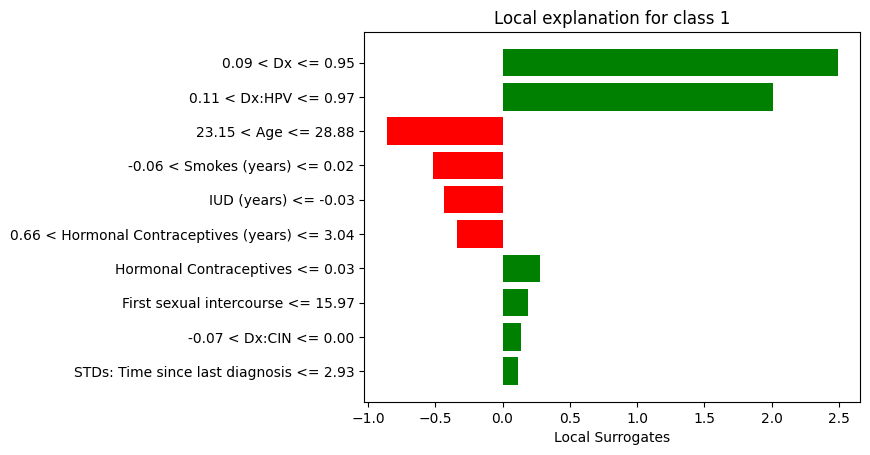

In [83]:
%matplotlib inline
fig = exp.as_pyplot_figure()
plt.xlabel("Local Surrogates")
# fig.savefig('/content/drive/My Drive/'+str(var)+'surrogate'+str(instance)+str(f)+'2.png', bbox_inches='tight')

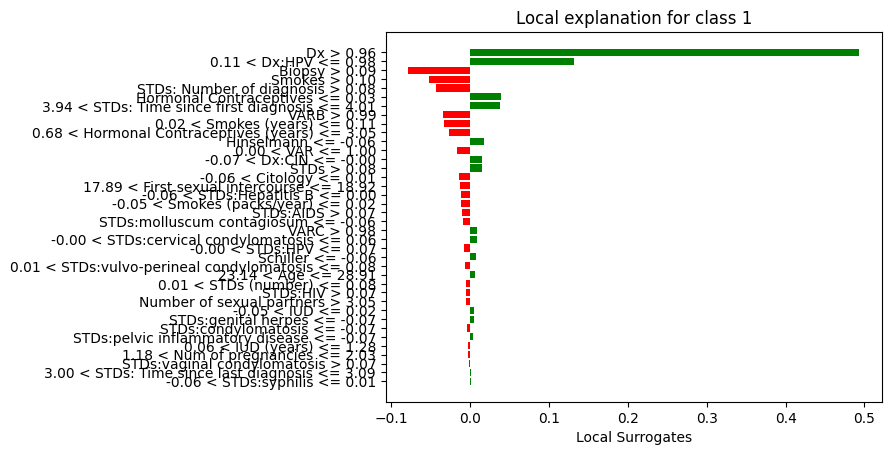

In [ ]:
%matplotlib inline
fig = exp.as_pyplot_figure()
plt.xlabel("Local Surrogates")
# fig.savefig('/content/drive/My Drive/'+str(var)+'surrogate'+str(instance)+str(f)+'.png', bbox_inches='tight')

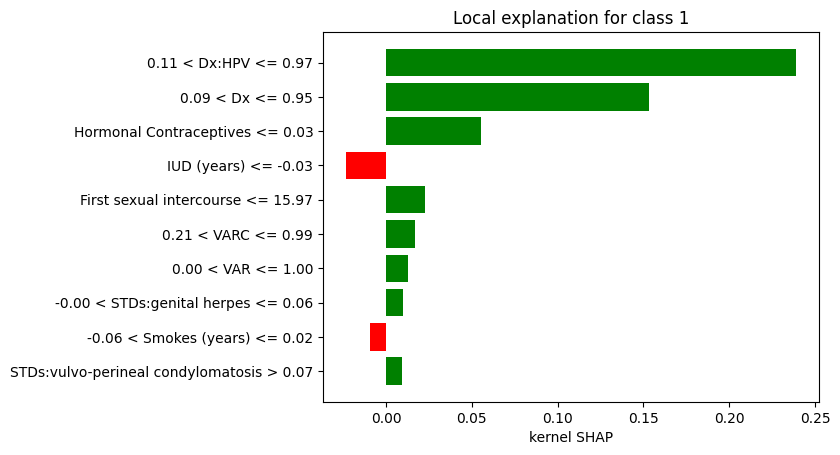

In [84]:
## kercontrib
kercontrib = kernelSHAP
items = kercontrib.iloc[instance].to_dict()
t = []
count=0
for i, item in enumerate(items):
  if abs(items[item]) > 0.0 :
    t.append((i, items[item]))

t = sorted(t, key=lambda tup: abs(tup[1]),  reverse=True)

exp_test = {1: t[0:maxx]}
exp.local_exp = exp_test
exp.show_in_notebook(show_table=False,show_predicted_value=False)

%matplotlib inline
fig = exp.as_pyplot_figure()
plt.xlabel("kernel SHAP")
# fig.savefig('/content/drive/My Drive/'+str(var)+'kernelSHAP'+str(instance)+str(f)+'.png', bbox_inches='tight')

In [85]:
# ## trecontrib
# items = trecontrib.iloc[instance].to_dict()
# t = []
# count=0
# for i, item in enumerate(items):
#   if abs(items[item]) > 0.0 :
#     t.append((i, items[item]))

# t = sorted(t, key=lambda tup: abs(tup[1]),  reverse=True)
# exp_test = {1: t[0:maxx]}
# exp.local_exp = exp_test
# exp.show_in_notebook(show_table=True,show_predicted_value=False)

# %matplotlib inline
# fig = exp.as_pyplot_figure()
# plt.xlabel("Tree SHAP")
# fig.savefig('/content/drive/My Drive/'+str(var)+'treeSHAP'+str(instance)+str(f)+'.png', bbox_inches='tight')

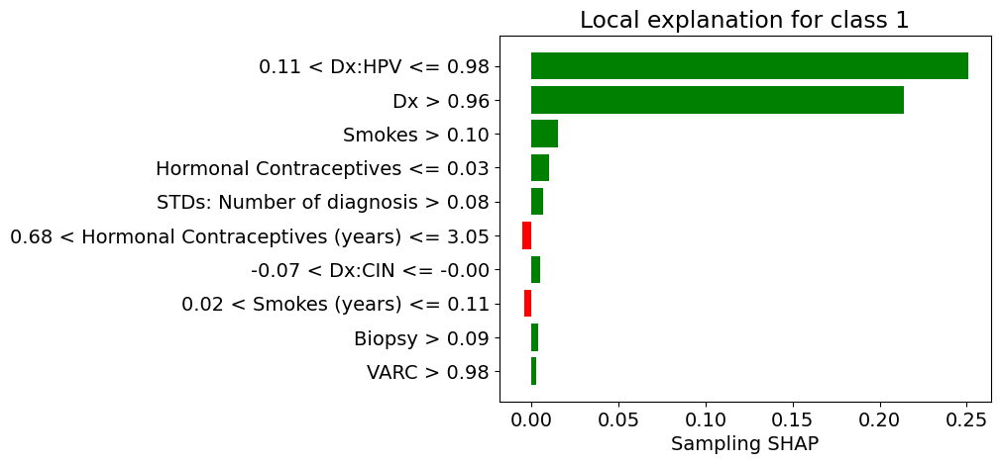

In [ ]:
### samcontrib
items = samplingSHAP.iloc[instance].to_dict()
t = []
count=0
for i, item in enumerate(items):
  if abs(items[item]) > 0.0 :
    t.append((i, items[item]))

t = sorted(t, key=lambda tup: abs(tup[1]),  reverse=True)
exp_test = {1: t[0:maxx]}
exp.local_exp = exp_test
exp.show_in_notebook(show_table=True,show_predicted_value=False)

%matplotlib inline
fig = exp.as_pyplot_figure()
plt.xlabel("Sampling SHAP")
# fig.savefig('/content/drive/My Drive/'+str(var)+'samplingSHAP'+str(instance)+str(f)+'.png', bbox_inches='tight')

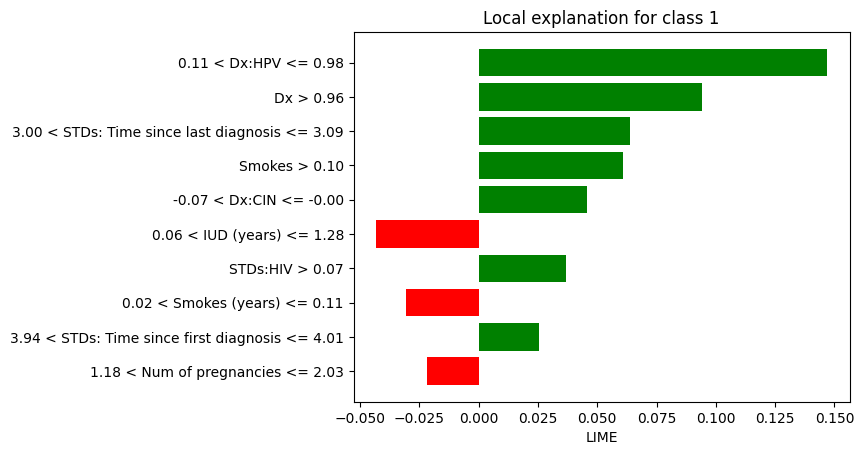

In [ ]:
### lime
items = limecontrib.iloc[instance].to_dict()
t = []
count=0
for i, item in enumerate(items):
  if abs(items[item]) > 0.0 :
    t.append((i, items[item]))

t = sorted(t, key=lambda tup: abs(tup[1]),  reverse=True)
exp_test = {1: t[0:maxx]}
exp.local_exp = exp_test
exp.show_in_notebook(show_table=True,show_predicted_value=False)

%matplotlib inline
fig = exp.as_pyplot_figure()
plt.xlabel("LIME")
# fig.savefig('/content/drive/My Drive/'+str(var)+'lime'+str(instance)+str(f)+'.png', bbox_inches='tight')

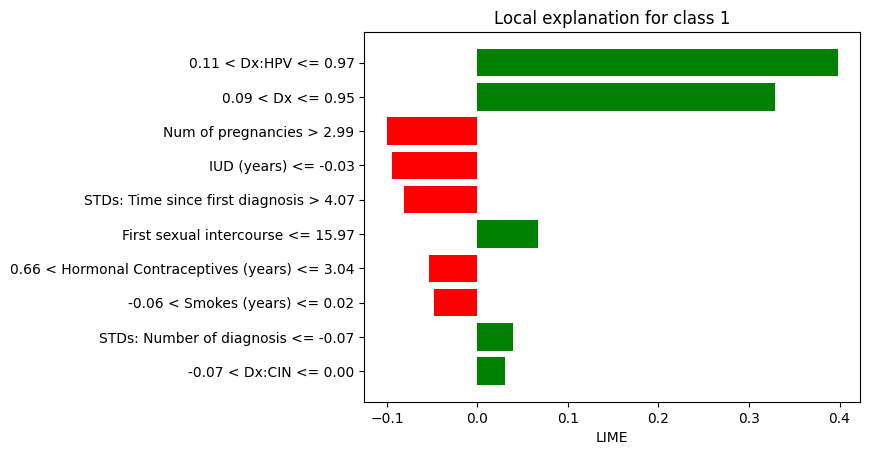

In [87]:
## lime
items = limecontrib.iloc[instance].to_dict()
t = []
count=0
for i, item in enumerate(items):
  if abs(items[item]) > 0.0 :
    t.append((i, items[item]))

t = sorted(t, key=lambda tup: abs(tup[1]),  reverse=True)
exp_test = {1: t[0:maxx]}
exp.local_exp = exp_test
exp.show_in_notebook(show_table=True,show_predicted_value=False)

%matplotlib inline
fig = exp.as_pyplot_figure()
plt.xlabel("LIME")
# fig.savefig('/content/drive/My Drive/'+str(var)+'lime'+str(instance)+str(f)+'2.png', bbox_inches='tight')

#### Faithfulness

In [68]:
### ROAR
def roar(featImp, feature_to_predict, datapath, savepath, dataname):
  a=['ro--', 'go--', 'mo--', 'yo--', 'co--', 'ko--', 'bo--']
  pourc=[0,10,20,30,40,60,70,90]
  font = {'size'   : 14}
  plt.rc('font', **font)

  for k in range(featImp.shape[0]):
    accuracies=[]
    new=[]
    for i in pourc:
      fi= featImp.iloc[k,:]
      fi.drop('Method', inplace=True)
      fi=fi.to_dict()
      fi=dict(sorted(fi.items(), key=lambda x:x[1], reverse=True))
      # fi.pop('Unnamed: 0')
      fi.pop('VARC')
      fi.pop('VARB')
      fi.pop('VAR')
      fii=list(fi.keys())

      df=datapath
      # print(fi)
      top=int((len(df.columns)*i)/100)
      fii = fii[top:]
      new=fii
      new.append(feature_to_predict)
      df=df[new]

      # X=np.array(df[list(df.columns.drop(feature_to_predict))])
      # y=np.array(df[feature_to_predict])
      X = np.array(df[list(df.columns.drop([feature_to_predict]))])
      y = np.array(df[feature_to_predict].to_numpy().reshape(-1, 1))
      # print('X y', X.shape, y.shape)
      model = RandomForestClassifier(random_state = 42)
      if X.shape[1] == 0:
        continue
      model.fit(X, y)
      scores = cross_val_score(model, X, y, cv=10)
      accuracies.append(np.mean(scores))

    plt.plot(pourc[:len(accuracies)], accuracies, a[k], label=featImp['Method'][k])

  plt.xlabel('% removed features for Cervical cancer risk factors')

  plt.ylabel('Accuracy')
  plt.legend(loc='upper right')
  # plt.savefig(savepath+'roar2.png', bbox_inches='tight', dpi=300)
  plt.show()

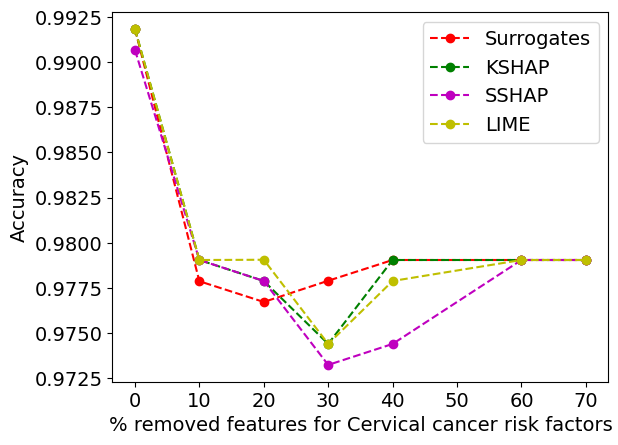

In [69]:
datapath= risk_factor_df
savepath= '/content/drive/My Drive/'
dataname='Cervical cancer'

roar(all_fi, label, datapath, savepath, dataname)

#### Contribution

In [193]:
from shapash.explainer.consistency import Consistency
from shapash import SmartExplainer
cns=Consistency()

INFO: Shap explainer type - <shap.explainers._tree.TreeExplainer object at 0x7b3dd47fd210>


In [195]:
model = nn_clf
xpl = SmartExplainer(model=model)
xpl.compile(x=X_test)

INFO: Shap explainer type - shap.explainers.PermutationExplainer()


PermutationExplainer explainer: 337it [00:39,  7.33it/s]                         


In [196]:
img=xpl.plot.contribution_plot(0)
# img.write_image('/content/drive/My Drive/contribage.png')

Downloading...
From: https://drive.google.com/uc?id=1-EKmCJlq6ecNwHU99fu1LWBDx7Ja78qW
To: /content/contribage.png
100%|██████████| 82.0k/82.0k [00:00<00:00, 55.3MB/s]


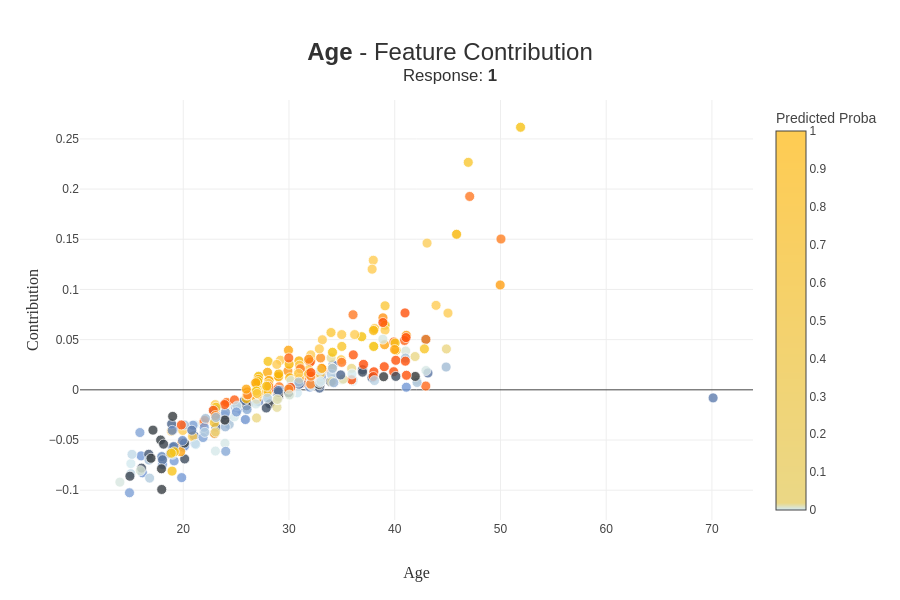

In [7]:
# contribage.png
im_url = 'https://drive.google.com/file/d/1-EKmCJlq6ecNwHU99fu1LWBDx7Ja78qW/view?usp=sharing'
output = "contribage.png"
gdown.download(im_url, output, fuzzy=True)
img = cv2.imread(output)
cv2_imshow(img)

In [199]:
xpl = SmartExplainer(model=model)
xpl.compile(x=X_test,contributions=kercontrib)

img=xpl.plot.contribution_plot(0)
# img.write_image('/content/drive/My Drive/contribagekernel.png')

Downloading...
From: https://drive.google.com/uc?id=1-LiCVwiLG-roQUoQuJ7tPtSPPARgRSGm
To: /content/contribagekernel.png
100%|██████████| 78.2k/78.2k [00:00<00:00, 63.7MB/s]


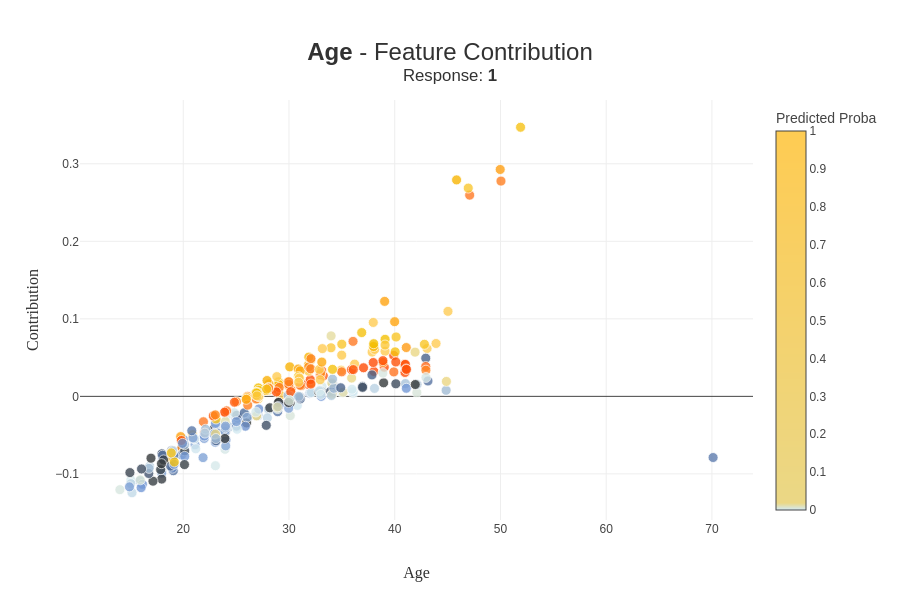

In [8]:
# contribagekernel.png
im_url = 'https://drive.google.com/file/d/1-LiCVwiLG-roQUoQuJ7tPtSPPARgRSGm/view?usp=sharing'
output = "contribagekernel.png"
gdown.download(im_url, output, fuzzy=True)
img = cv2.imread(output)
cv2_imshow(img)

In [207]:
xpl = SmartExplainer(model=model)
samcontrib = samplingSHAP
xpl.compile(x=X_test,contributions=samcontrib)
img = xpl.plot.contribution_plot(0)
# img.write_image('/content/drive/My Drive/contribagesampling.png')

Downloading...
From: https://drive.google.com/uc?id=1-MM3uvePYI_hl6_IMgjuRYhZiIZUx62p
To: /content/contribagesamplingcontribagesampling.png
100%|██████████| 81.0k/81.0k [00:00<00:00, 63.6MB/s]


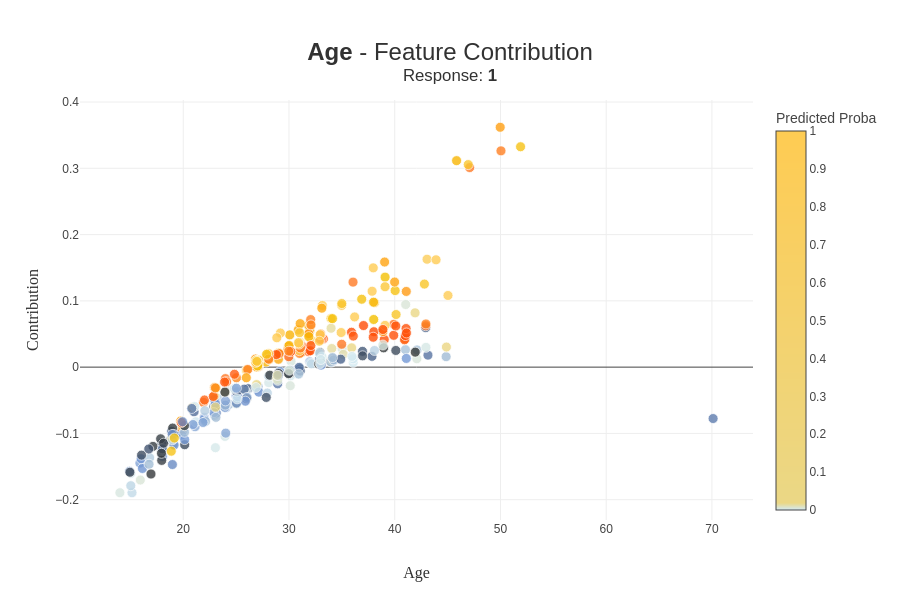

In [9]:
# contribagesampling.png
im_url = 'https://drive.google.com/file/d/1-MM3uvePYI_hl6_IMgjuRYhZiIZUx62p/view?usp=sharing'
output = "contribagesamplingcontribagesampling.png"
gdown.download(im_url, output, fuzzy=True)
img = cv2.imread(output)
cv2_imshow(img)

In [206]:
xpl = SmartExplainer(model=model)
xpl.compile(x=X_test,contributions=limecontrib)
img = xpl.plot.contribution_plot(0)
# img.write_image('/content/drive/My Drive/contribagelime.png')

Downloading...
From: https://drive.google.com/uc?id=1-MqAa_CV22sdnA-zQFkygzHRnlqWQpIm
To: /content/contribagelime.png
100%|██████████| 76.3k/76.3k [00:00<00:00, 55.2MB/s]


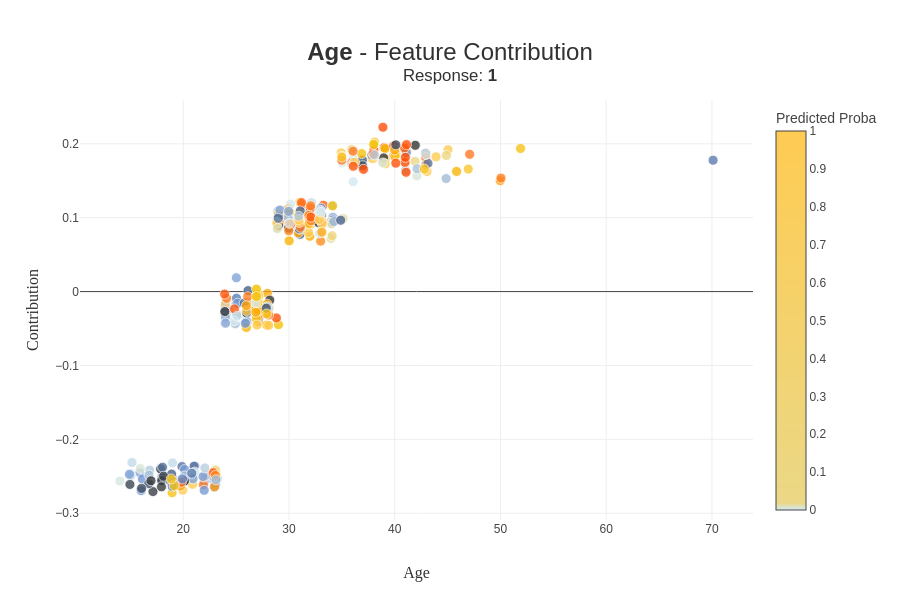

In [10]:
# contribagelime
im_url = 'https://drive.google.com/file/d/1-MqAa_CV22sdnA-zQFkygzHRnlqWQpIm/view?usp=sharing'
output = "contribagelime.png"
gdown.download(im_url, output, fuzzy=True)
img = cv2.imread(output)
cv2_imshow(img)

In [292]:
# Contribution plot for features
fig_image = xpl.plot.contribution_plot(29) # change col name for features
fig_image.show()

#### Consistency

In [211]:
# Consistency
pairwise_consistency = cns.calculate_all_distances(methods, weights)
test = pairwise_consistency[1].round(2)

In [212]:
test.style.background_gradient(cmap='Paired_r')

,Surrogates,KSHAP,SSHAP,LIME
Surrogates,0.000000,0.410000,0.470000,0.700000
KSHAP,0.410000,0.000000,0.270000,0.660000
SSHAP,0.470000,0.270000,0.000000,0.550000
LIME,0.700000,0.660000,0.550000,0.000000


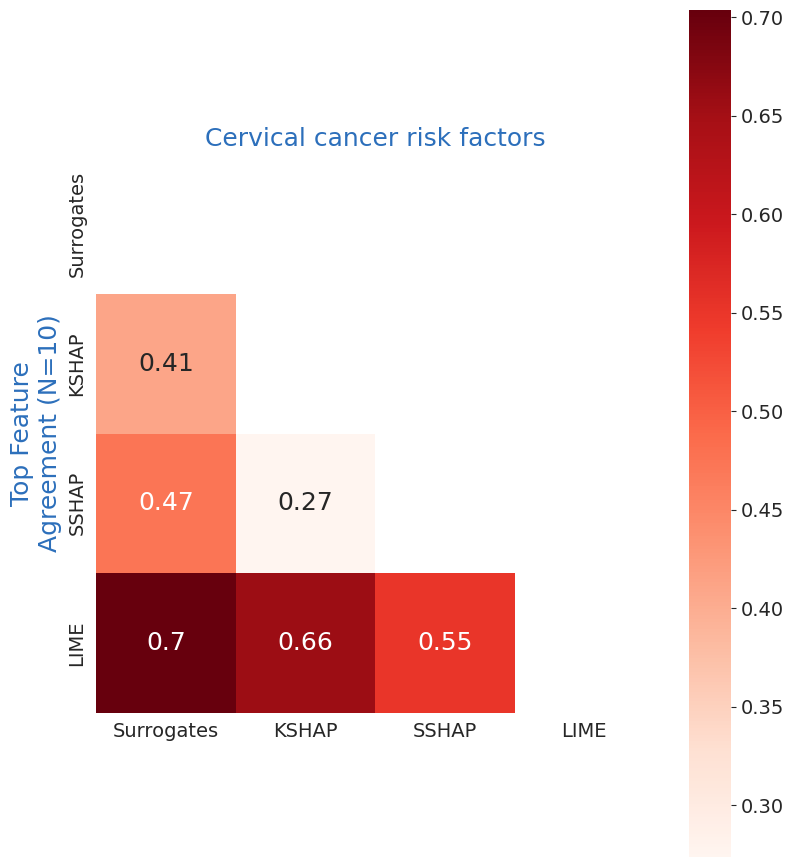

In [214]:
corr = pairwise_consistency[1]
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
fig = plt.figure(figsize=(9, 11))
with sns.axes_style("white"):
    ax = sns.heatmap(corr, mask=mask, square=True,annot=True, annot_kws={'fontsize': 18}, xticklabels=methods, yticklabels=methods, cmap="Reds", cbar=True)
    ax.set_title("Cervical cancer risk factors", color='xkcd:medium blue', fontsize=18)
    ax.set_ylabel('Top Feature\nAgreement (N=10)', color='xkcd:medium blue', fontsize=18)
    plt.show()

In [215]:
# fig.savefig('/content/drive/My Drive/consistency.png', bbox_inches='tight', dpi=300)

In [216]:
for i in pairwise_consistency[1].columns:
  print(i, round(np.mean(pairwise_consistency[1][i]),2))

Surrogates 0.4
KSHAP 0.34
SSHAP 0.32
LIME 0.48


#### Compactness

In [217]:
def get_distance(selection, contributions, mode, nb_features):
    if mode == "classification" and len(contributions) == 2:
        contributions = contributions[1]
    assert nb_features <= contributions.shape[1]

    contributions = contributions.loc[selection].values
    top_features = np.array([sorted(row, key=abs, reverse=True) for row in contributions])[:, :nb_features]
    output_top_features = np.sum(top_features[:, :], axis=1)
    output_all_features = np.sum(contributions[:, :], axis=1)

    if mode == "regression":
        distance = abs(output_top_features - output_all_features) / abs(output_all_features)
    elif mode == "classification":
        distance = abs(output_top_features - output_all_features)
    return distance


def get_min_nb_features(selection, contributions, mode, distance):
    assert 0 <= distance <= 1
    if mode == "classification" and len(contributions) == 2:
        contributions = contributions[1]
    contributions = contributions.loc[selection].values
    features_needed = []
    # For each instance, add features one by one (ordered by SHAP) until we get close enough
    for i in range(contributions.shape[0]):
        ids = np.flip(np.argsort(np.abs(contributions[i, :])))
        output_value = np.sum(contributions[i, :])

        score = 0
        for j, idx in enumerate(ids):
            # j : number of features needed
            # idx : positions of the j top shap values
            score += contributions[i, idx]
            if mode == "regression":
                if abs(score - output_value) < distance * abs(output_value):
                    break
            elif mode == "classification":
                if abs(score - output_value) < distance:
                    break
        features_needed.append(j + 1)
    return features_needed



def compute_features_compacity(case, contributions, selection, distance, nb_features):
        features_needed = get_min_nb_features(selection, contributions, case, distance)
        distance_reached = get_distance(selection, contributions, case, nb_features)
        # We clip large approximations to 100%
        distance_reached = np.clip(distance_reached, 0, 1)
        return {"features_needed": features_needed, "distance_reached": distance_reached}

In [218]:
compacities=[]
for weight in weights:
  rr=compute_features_compacity(case="classification", contributions=weight, selection=list(range(0, len(X_test))), distance=.9, nb_features=5)
  #rr=compute_features_compacity(case="classification", contributions=weight, selection=[instance], distance=0.9, nb_features=5)
  compacities.append(pd.DataFrame.from_dict(rr))

In [219]:
maxx=[]
for c in compacities:
  maxx.append(c.iloc[c.distance_reached.idxmax()].tolist())
compacity=pd.DataFrame(data=maxx, columns=['features_needed', 'distance_reached'])
compacity['Method']=methods
compacity.set_index('Method', drop=True).round(2)

,features_needed,distance_reached
Method,,
Surrogates,6.0,1.00
KSHAP,1.0,0.20
SSHAP,1.0,0.13
LIME,1.0,0.48


In [225]:
xpl = SmartExplainer(model=model)
xpl.compile(x=X_test,contributions=gscontrib)
img = xpl.plot.compacity_plot()
# img.write_image('/content/drive/My Drive/'+str(var)+'compactgs.png')

Downloading...
From: https://drive.google.com/uc?id=1-fyy2XGsH4x-NUhsag3PxH9Od7a_ddtC
To: /content/Wcompactgs.png
100%|██████████| 50.9k/50.9k [00:00<00:00, 58.0MB/s]


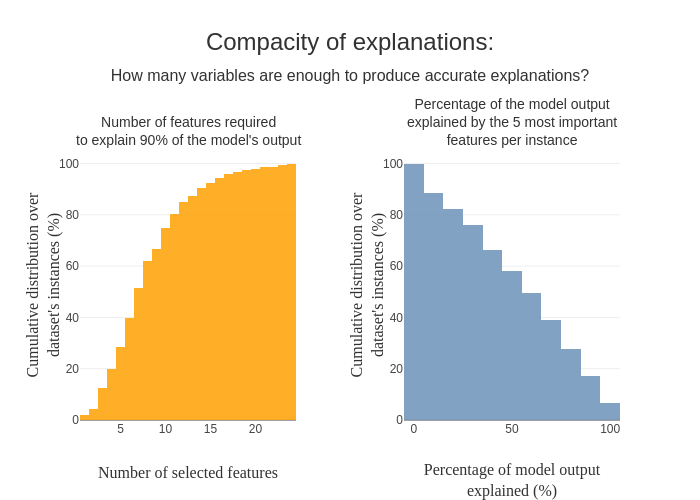

In [11]:
# Wcompactgs
im_url = 'https://drive.google.com/file/d/1-fyy2XGsH4x-NUhsag3PxH9Od7a_ddtC/view?usp=sharing'
output = "Wcompactgs.png"
gdown.download(im_url, output, fuzzy=True)
img = cv2.imread(output)
cv2_imshow(img)

In [229]:
xpl = SmartExplainer(model=model)
xpl.compile(x=X_test,contributions=kercontrib)
img = xpl.plot.compacity_plot()
# img.write_image('/content/drive/My Drive/'+str(var)+'compactkernel.png')

Downloading...
From: https://drive.google.com/uc?id=1-mpL7zHmiLdKlvDzC4kJPM_CJVfHiyG6
To: /content/Wcompactkernel.png
100%|██████████| 51.5k/51.5k [00:00<00:00, 34.1MB/s]


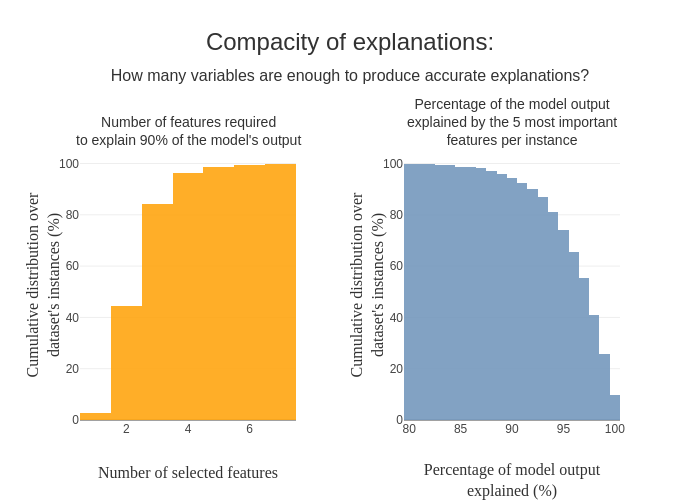

In [12]:
# Wcompactkernel
im_url = 'https://drive.google.com/file/d/1-mpL7zHmiLdKlvDzC4kJPM_CJVfHiyG6/view?usp=sharing'
output = "Wcompactkernel.png"
gdown.download(im_url, output, fuzzy=True)
img = cv2.imread(output)
cv2_imshow(img)

In [231]:
xpl = SmartExplainer(model=model)
xpl.compile(x=X_test,contributions=samcontrib)
img = xpl.plot.compacity_plot()
# img.write_image('/content/drive/My Drive/'+str(var)+'compactsampling.png')

Downloading...
From: https://drive.google.com/uc?id=1-xIiDFETg8H2OoIrHtLIlivYK046EJqQ
To: /content/Wcompactsampling.png
100%|██████████| 51.1k/51.1k [00:00<00:00, 55.3MB/s]


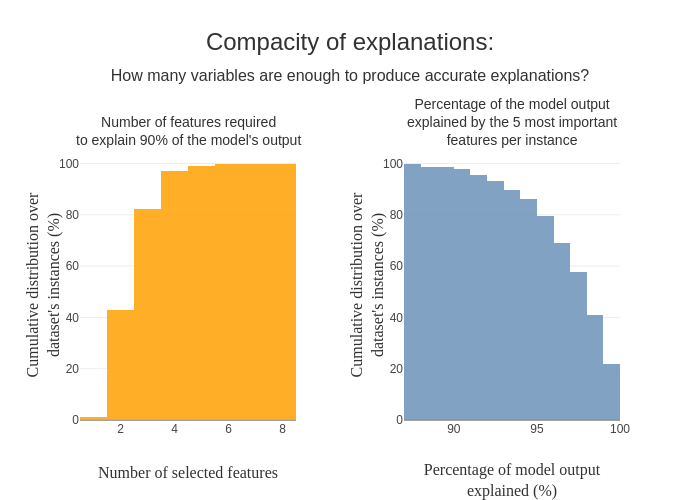

In [13]:
# Wcompactsampling
im_url = 'https://drive.google.com/file/d/1-xIiDFETg8H2OoIrHtLIlivYK046EJqQ/view?usp=sharing'
output = "Wcompactsampling.png"
gdown.download(im_url, output, fuzzy=True)
img = cv2.imread(output)
cv2_imshow(img)

In [233]:
xpl = SmartExplainer(model=model)
xpl.compile(x=X_test,contributions=limecontrib)
img= xpl.plot.compacity_plot()
# img.write_image('/content/drive/My Drive/'+str(var)+'compactlime.png')

Downloading...
From: https://drive.google.com/uc?id=1-yIOvEP9ZArOCs5KGa7VH2y2Qi2Uc7uK
To: /content/Wcompactlime.png
100%|██████████| 50.8k/50.8k [00:00<00:00, 54.8MB/s]


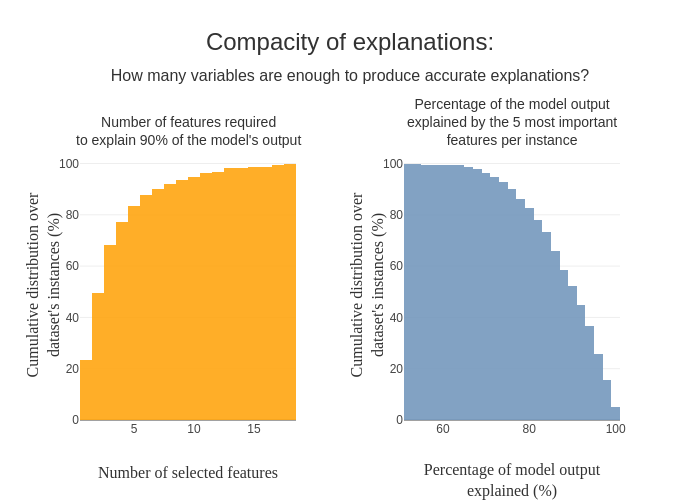

In [14]:
# Wcompactlime
im_url = 'https://drive.google.com/file/d/1-yIOvEP9ZArOCs5KGa7VH2y2Qi2Uc7uK/view?usp=sharing'
output = "Wcompactlime.png"
gdown.download(im_url, output, fuzzy=True)
img = cv2.imread(output)
cv2_imshow(img)

#### Stability

In [54]:
def _compute_distance(x1, x2, mean_vector, epsilon=0.0000001):
    diff = np.sum(np.abs(x1 - x2) / (mean_vector + epsilon))
    return diff


def _compute_similarities(instance, dataset):
    mean_vector = np.array(dataset, dtype=np.float32).std(axis=0)
    similarity_distance = np.zeros(dataset.shape[0])

    for j in range(0, dataset.shape[0]):
        # Calculate distance between point and instance j
        dist = _compute_distance(instance, dataset[j], mean_vector)
        similarity_distance[j] = dist
    return similarity_distance


def _get_radius(dataset, n_neighbors, sample_size=50, percentile=95):
    # Select 500 points max to sample
    size = min([dataset.shape[0], sample_size])
    # Randomly sample points from dataset
    sampled_instances = dataset[np.random.randint(0, dataset.shape[0], size), :]
    # Define normalization vector
    mean_vector = np.array(dataset, dtype=np.float32).std(axis=0)
    # Initialize the similarity matrix
    similarity_distance = np.zeros((size, size))
    # Calculate pairwise distance between instances
    for i in range(size):
        for j in range(i, size):
            dist = _compute_distance(sampled_instances[i], sampled_instances[j], mean_vector)
            similarity_distance[i, j] = dist
            similarity_distance[j, i] = dist
    # Select top n_neighbors
    ordered_X = np.sort(similarity_distance)[:, 1: n_neighbors + 1]
    # Select the value of the distance that captures XX% of all distances (percentile)
    return np.percentile(ordered_X.flatten(), percentile)


def find_neighbors(selection, dataset, model, mode, n_neighbors=30):
    """
    For each instance, select neighbors based on 3 criteria:
    1. First pick top N closest neighbors (L1 Norm + st. dev normalization)
    2. Filter neighbors whose model output is too different from instance (see condition below)
    3. Filter neighbors whose distance is too big compared to a certain threshold
    """
    instances = dataset.loc[selection].values

    all_neighbors = np.empty((0, instances.shape[1] + 1), float)
    """Filter 1 : Pick top N closest neighbors"""
    for instance in instances:
        c = _compute_similarities(instance, dataset.values)
        # Pick indices of the closest neighbors (and include instance itself)
        neighbors_indices = np.argsort(c)[: n_neighbors + 1]
        # Return instance with its neighbors
        neighbors = dataset.values[neighbors_indices]
        # Add distance column
        neighbors = np.append(neighbors, c[neighbors_indices].reshape(n_neighbors + 1, 1), axis=1)
        all_neighbors = np.append(all_neighbors, neighbors, axis=0)

    # Calculate predictions for all instances and corresponding neighbors
    if mode == "regression":
        # For XGB it is necessary to add columns in df, otherwise columns mismatch
        predictions = model.predict(pd.DataFrame(all_neighbors[:, :-1], columns=dataset.columns))
    elif mode == "classification":
        predictions = model.predict_proba(pd.DataFrame(all_neighbors[:, :-1], columns=dataset.columns))[:, 1]
    # Add prediction column
    all_neighbors = np.append(all_neighbors, predictions.reshape(all_neighbors.shape[0], 1), axis=1)
    # Split back into original chunks (1 chunck = instance + neighbors)
    all_neighbors = np.split(all_neighbors, instances.shape[0])

    """Filter 2 : neighbors with similar blackbox output"""
    # Remove points if prediction is far away from instance prediction
    if mode == "regression":
        # Trick : use enumerate to allow the modifcation directly on the iterator
        for i, neighbors in enumerate(all_neighbors):
            all_neighbors[i] = neighbors[abs(neighbors[:, -1] - neighbors[0, -1]) < 0.1 * abs(neighbors[0, -1])]
    elif mode == "classification":
        for i, neighbors in enumerate(all_neighbors):
            all_neighbors[i] = neighbors[abs(neighbors[:, -1] - neighbors[0, -1]) < 0.1]

    """Filter 3 : neighbors below a distance threshold"""
    # Remove points if distance is bigger than radius
    radius = _get_radius(dataset.values, n_neighbors)

    for i, neighbors in enumerate(all_neighbors):
        # -2 indicates the distance column
        all_neighbors[i] = neighbors[neighbors[:, -2] < radius]
    return all_neighbors


def shap_neighbors(instance, x_encoded, contributions, mode):
    """
    For an instance and corresponding neighbors, calculate various
    metrics (described below) that are useful to evaluate local stability
    """
    # Extract SHAP values for instance and neighbors
    # :-2 indicates that two columns are disregarded : distance to instance and model output
    ind = pd.merge(x_encoded.reset_index(), pd.DataFrame(instance[:, :-2], columns=x_encoded.columns), how='inner')\
        .set_index(x_encoded.index.name if x_encoded.index.name is not None else 'index').index
    # If classification, select contrbutions of one class only
    if mode == "classification" and len(contributions) == 2:
        contributions = contributions[1]
    shap_values = contributions.loc[ind]
    # For neighbors comparison, the sign of SHAP values is taken into account
    norm_shap_values = normalize(shap_values, axis=1, norm="l1")
    # But not for the average impact of the features across the dataset
    norm_abs_shap_values = normalize(np.abs(shap_values), axis=1, norm="l1")
    # Compute the average difference between the instance and its neighbors
    average_diff = np.divide(norm_shap_values.std(axis=0), norm_abs_shap_values.mean(axis=0),
                             out=np.zeros(norm_abs_shap_values.shape[1]),
                             where=norm_abs_shap_values.mean(axis=0) != 0)

    return norm_shap_values, average_diff, norm_abs_shap_values[0, :]


def get_distance(selection, contributions, mode, nb_features):
    if mode == "classification" and len(contributions) == 2:
        contributions = contributions[1]
    assert nb_features <= contributions.shape[1]

    contributions = contributions.loc[selection].values
    top_features = np.array([sorted(row, key=abs, reverse=True) for row in contributions])[:, :nb_features]
    output_top_features = np.sum(top_features[:, :], axis=1)
    output_all_features = np.sum(contributions[:, :], axis=1)

    if mode == "regression":
        distance = abs(output_top_features - output_all_features) / abs(output_all_features)
    elif mode == "classification":
        distance = abs(output_top_features - output_all_features)
    return distance


def compute_features_stability (case, x, selection, contributions):
      x_encoded=x
      x_init=x
      all_neighbors = find_neighbors(selection, x_encoded, model, case)

      # Check if entry is a single instance or not
      if len(selection) == 1:
          # Compute explanations for instance and neighbors
          norm_shap, _, _ = shap_neighbors(all_neighbors[0], x_encoded, contributions, case)
          local_neighbors = {"norm_shap": norm_shap}
          return local_neighbors
      else:
          numb_expl = len(selection)
          amplitude = np.zeros((numb_expl, x_init.shape[1]))
          variability = np.zeros((numb_expl, x_init.shape[1]))
          # For each instance (+ neighbors), compute explanation
          for i in range(numb_expl):
              (_, variability[i, :], amplitude[i, :],) = shap_neighbors(all_neighbors[i], x_encoded, contributions, case)
          features_stability = {"variability": variability, "amplitude": amplitude}
          return features_stability


##### one instance

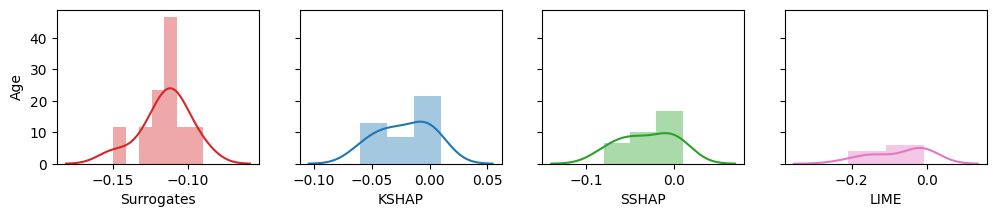

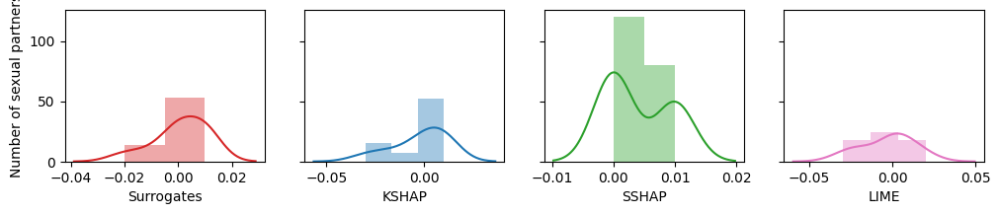

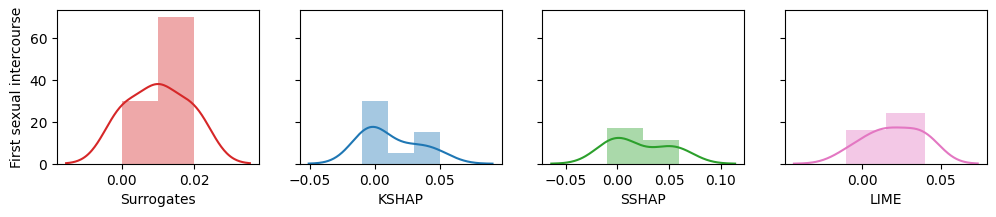

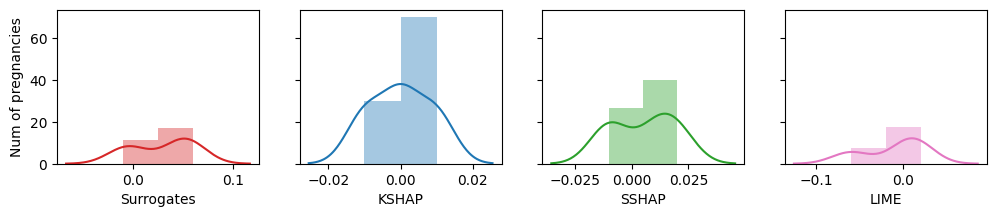

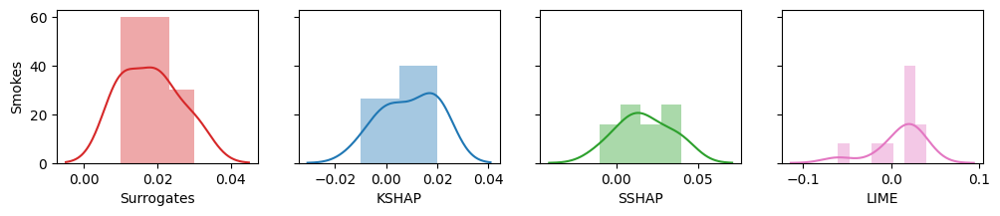

...

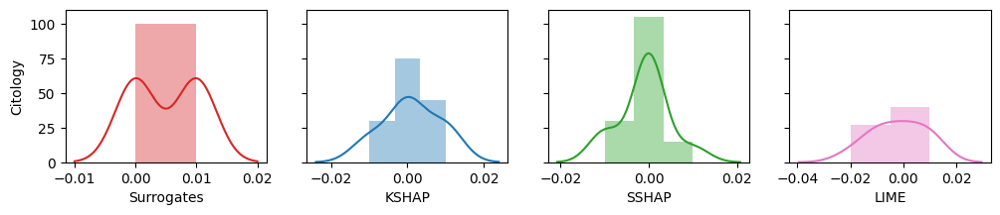

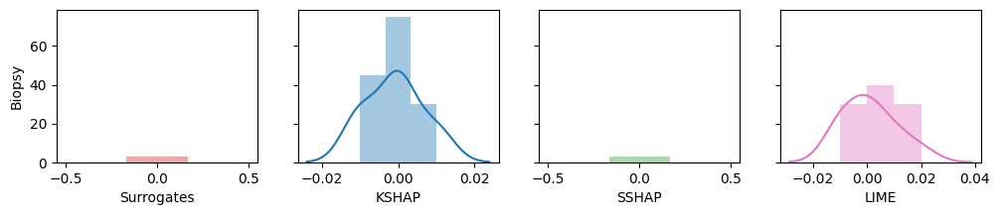

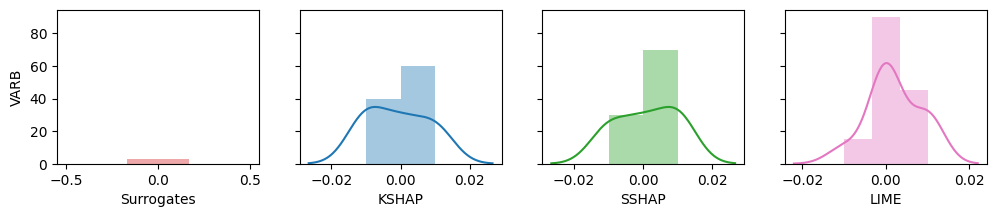

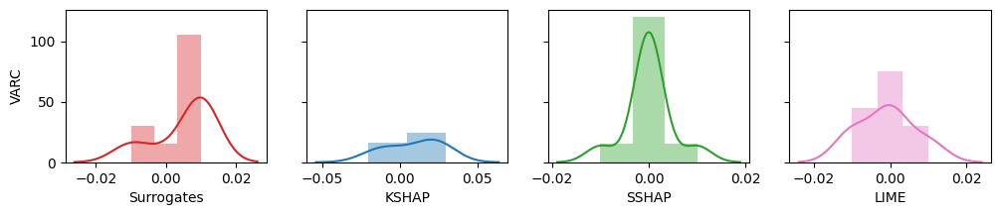

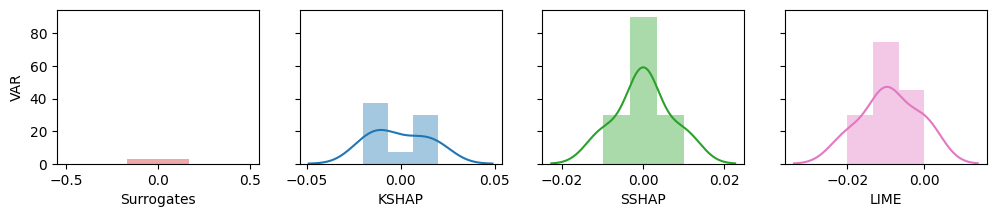

In [55]:
frames=[]
features=list(X_test.columns)
for weight in weights:
  #fs= compute_features_stability (case="classification", x=X_test, selection=list(range(0, len(X_test))), contributions=weight)
  fs= compute_features_stability (case="classification", x=X_test, selection=[instance], contributions=weight)
  frames.append(fs)

colors = ['tab:red', 'tab:blue', 'tab:green', 'tab:pink', 'tab:olive',  'tab:orange',  'tab:gray']
for j in range(len(features)):
  fig, axes = plt.subplots(1, len(methods), figsize=(12, 2), sharey=True, dpi=100)
  t=0

  for fg, fs in enumerate(frames):
    am=[]
    for i in range(len(fs['norm_shap'])):
      am.append(round(fs['norm_shap'][i][j], 2)) # i INSCTANCE j Feature
    sns.distplot(am, ax=axes[fg], color=colors[t], axlabel=methods[t])
    t=t+1
    axes[fg].set_ylabel(features[j])
  # plt.savefig('/content/drive/My Drive/'+str(var)+str(instance)+str(features[j])[:10]+'2.png', bbox_inches='tight', dpi=300)
  plt.show()

##### multiple instance

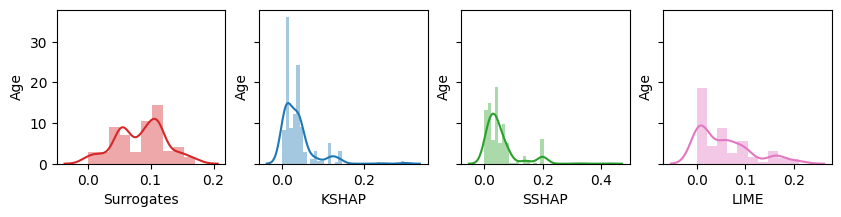

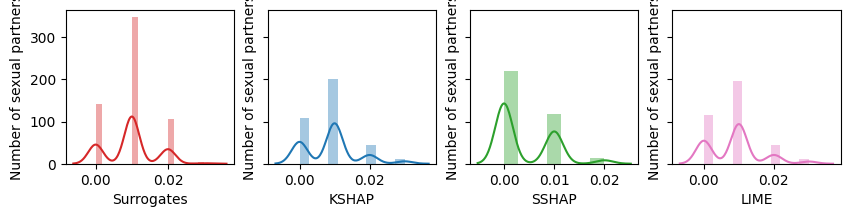

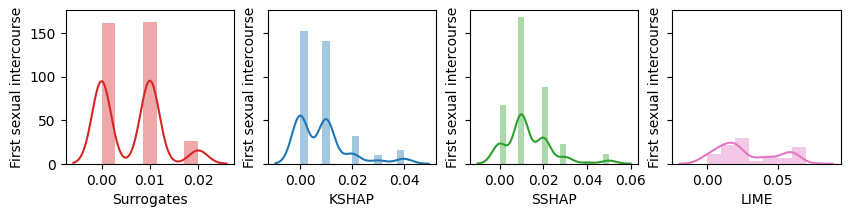

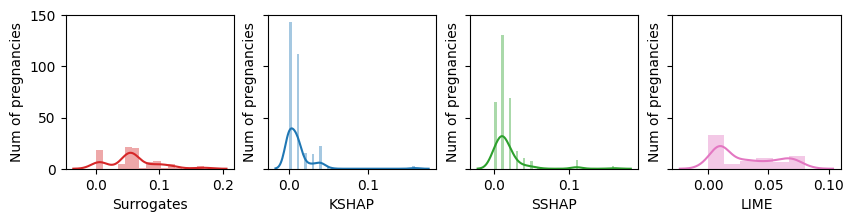

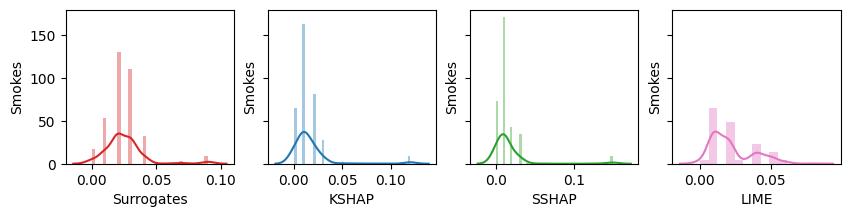

...

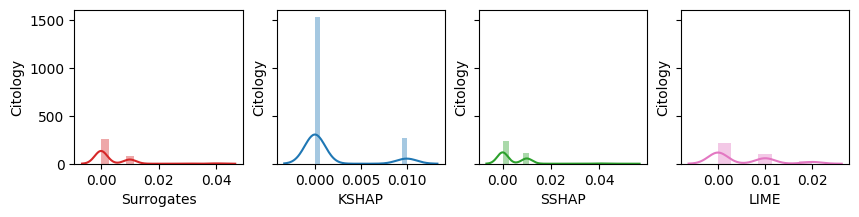

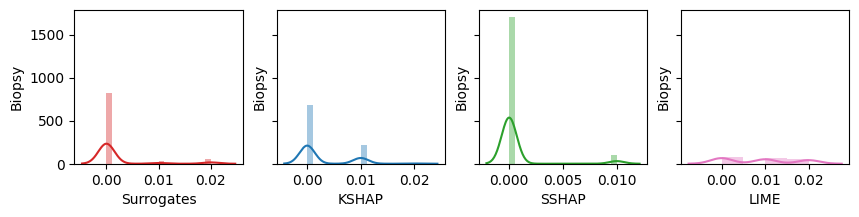

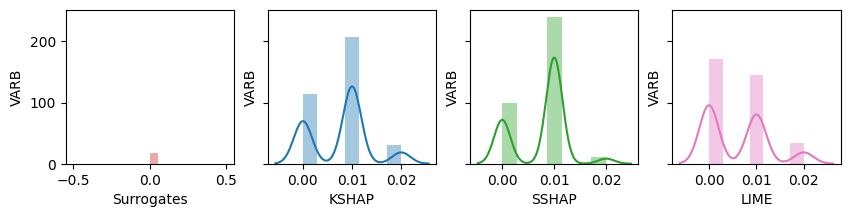

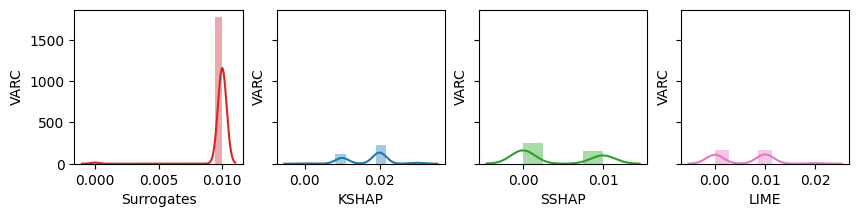

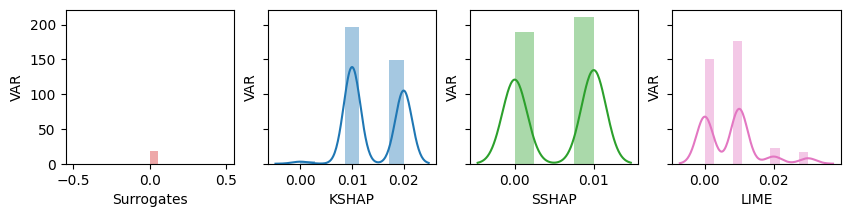

In [56]:
frames=[]
for weight in weights:
  fs= compute_features_stability (case="classification", x=X_test, selection=list(range(0, len(X_test))), contributions=weight)
  #fs= compute_features_stability (case="classification", x=X_test, selection=[1,4], contributions=weight)
  frames.append(fs)

colors = ['tab:red', 'tab:blue', 'tab:green', 'tab:pink', 'tab:olive',  'tab:orange',  'tab:gray']
for j in range(len(features)):
  fig, axes = plt.subplots(1, len(methods), figsize=(10, 2), sharey=True, dpi=100)
  t=0
  for fg, fs in enumerate(frames):
    vr=[]
    am=[]
    for i in range(len(fs['variability'])):
      vr.append(round(fs['variability'][i][j], 2)) # i INSCTANCE j Feature
      am.append(round(fs['amplitude'][i][j], 2))
    axes[fg].set_ylabel(features[j])
    sns.distplot(am, ax=axes[fg], color=colors[t], axlabel=methods[t])
    t=t+1
    #print('VR', vr)
  # plt.savefig('/content/drive/My Drive/'+str(var)+str(features[j])[:10]+'2.png')
  plt.show()

In [239]:
t=0
for fg, fs in enumerate(frames):
  vr=[]
  am=[]
  for j in range(len(features)):
    vr.append(np.mean(fs['variability'][j])) # i INSCTANCE j Feature
    am.append(np.std(fs['variability'][j]))
  print(methods[t], round(np.mean(vr),2))
  print(methods[t], round(np.std(am),2))
  t+=1

Surrogates 0.92
Surrogates 0.03
KSHAP 1.1
KSHAP 0.03
SSHAP 1.12
SSHAP 0.03
LIME 1.12
LIME 0.04


In [246]:
# xpl.plot.stability_plot(selection=[0, 1, 3])
fig_image=xpl.plot.stability_plot()
# plt.savefig('/content/drive/My Drive/stabplot.png')

Computed values from previous call are used


<Figure size 640x480 with 0 Axes>

In [247]:
%matplotlib inline
fig_image.show()

In [251]:
%matplotlib inline
for w in weights:
  xpl = SmartExplainer(model=model)
  xpl.compile(x=X_test,contributions=w)
  fig_image=xpl.plot.stability_plot()
  fig_image.show()

#### Feature and Rank disagreement

In [250]:
def intersection(r1, r2):
    return list(set(r1) & set(r2))

def check_size(r1, r2):
    assert len(r1) == len(r2), 'Both rankings should be the same size'

def feature_agreement(r1, r2):
    check_size(r1, r2)
    k = len(r1s)

    return len(intersection(r1, r2)) / k

def rank_agreement(r1, r2):
    check_size(r1, r2)
    k = len(r1)

    return np.sum([True if x==y else False for x,y in zip(r1,r2)]) / k

def weak_rank_agreement(r1, r2):
    check_size(r1, r2)
    k = len(r1)
    window_size = 1 # Check if the rank is approximately close (within one rank).

    rank_agree=[]
    for i, v in enumerate(r1):
        if i == 0:
            if v in r2[i:i+window_size+1]:
                rank_agree.append(True)
            else:
                rank_agree.append(False)
        else:
            if v in r2[i-window_size:i+window_size+1]:
                rank_agree.append(True)
            else:
                rank_agree.append(False)

    return np.sum(rank_agree)/k


def rank_correlation(r1, r2):
    return spearmanr(r1, r2)

def to_rankings(df, instance):
    contrib_features = df.columns
    vals = df[contrib_features].values[instance,:]
    rankings = np.argsort(np.absolute(vals))[::-1]
    # features = vals[rankings]
    return rankings


def compute_matrices(weights, instance):
    n_rankings = len(methods)
    feature_agree = np.zeros((n_rankings, n_rankings))
    rank_agree = np.zeros((n_rankings, n_rankings))
    corr = np.zeros((n_rankings, n_rankings))

    for i, j in itertools.product(range(n_rankings), range(n_rankings)):
        r1 = to_rankings(weights[i], instance)[:10]
        r2 = to_rankings(weights[j], instance)[:10]
        feature_agree[i,j] = feature_agreement(r1, r2)
        rank_agree[i,j] = rank_agreement(r1, r2)

    return feature_agree, rank_agree

In [252]:
# compute feature agreement and rank agreement
feature_agree, rank_agree = compute_matrices(weights, instance)

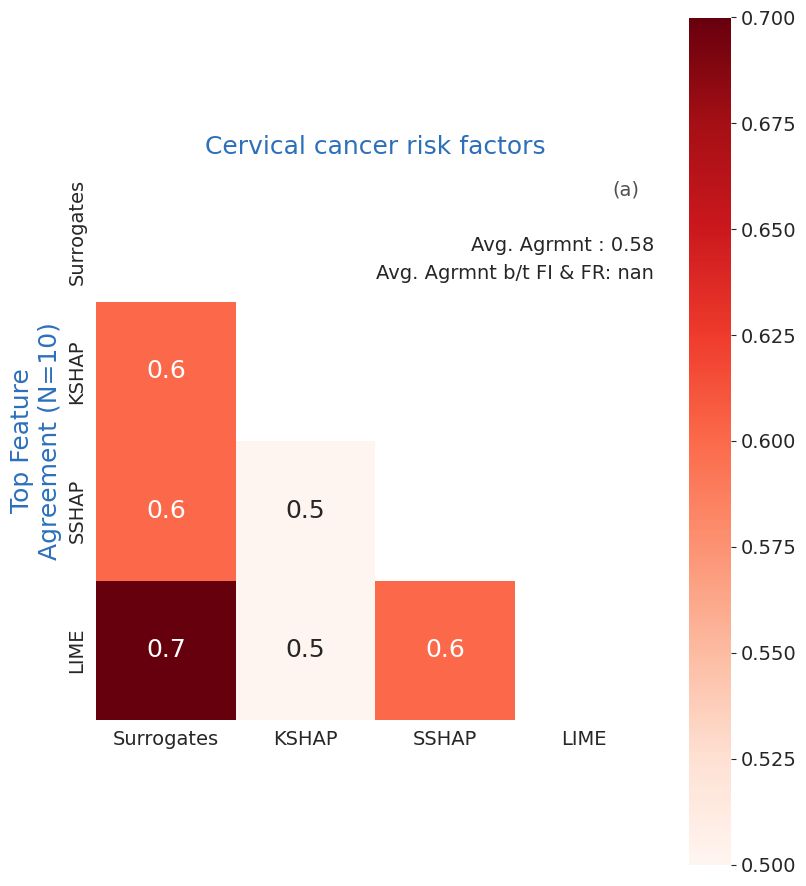

In [253]:
corr = feature_agree
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
fig = plt.figure(figsize=(9, 11))

with sns.axes_style("white"):
    ax = sns.heatmap(corr, mask=mask, square=True,annot=True, annot_kws={'fontsize': 18}, xticklabels=methods, yticklabels=methods, cmap="Reds", cbar=True)
    ax.set_title("Cervical cancer risk factors", color='xkcd:medium blue', fontsize=18)
    ax.set_ylabel('Top Feature\nAgreement (N=10)', color='xkcd:medium blue', fontsize=18)
    ax.text(0.95, 0.95, f"(a)", fontsize=14, alpha=0.8, ha="center", va="center", transform=ax.transAxes)

    data=corr
    avg = np.mean(data[mask==0])
    text = f'Avg. Agrmnt : {avg:.2f}'
    ax.annotate(text, (1.0, 0.84), xycoords='axes fraction', fontsize=14, ha='right')

    avg = np.mean(data[4:, :4])
    text = f'Avg. Agrmnt b/t FI & FR: {avg:.2f}'
    ax.annotate(text, (1.0, 0.79), xycoords='axes fraction', fontsize=14, ha='right')
    plt.show()

In [254]:
# fig.savefig('/content/drive/My Drive/featagrem'+str(instance)+'.png', bbox_inches='tight', dpi=300)

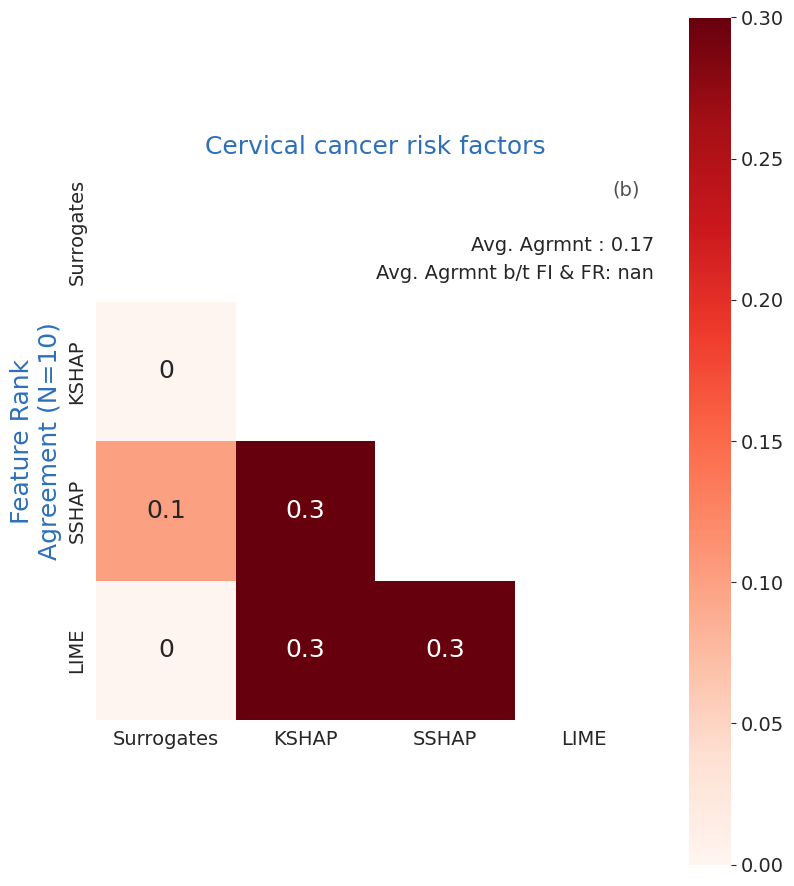

In [255]:
corr = rank_agree
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
fig = plt.figure(figsize=(9, 11))

with sns.axes_style("white"):
    ax = sns.heatmap(corr, mask=mask, square=True,annot=True, annot_kws={'fontsize': 18}, xticklabels=methods, yticklabels=methods, cmap="Reds")
    ax.set_title("Cervical cancer risk factors", color='xkcd:medium blue', fontsize=18)
    ax.set_ylabel('Feature Rank\nAgreement (N=10)', color='xkcd:medium blue',fontsize=18 )
    ax.text(0.95, 0.95, f"(b)", fontsize=14, alpha=0.8, ha="center", va="center", transform=ax.transAxes)

    data=corr
    avg = np.mean(data[mask==0])
    text = f'Avg. Agrmnt : {avg:.2f}'
    ax.annotate(text, (1.0, 0.84), xycoords='axes fraction', fontsize=14, ha='right')

    avg = np.mean(data[4:, :4])
    text = f'Avg. Agrmnt b/t FI & FR: {avg:.2f}'
    ax.annotate(text, (1.0, 0.79), xycoords='axes fraction', fontsize=14, ha='right')
    plt.show()

In [256]:
# fig.savefig('/content/drive/My Drive/rankagrem'+str(instance)+'.png', bbox_inches='tight', dpi=300)

# Discussions

#### Implications of the experimental results

Most of the functionality in the original paper was reproducible. However, some of the specific explainability results we were unable to reproduce regardless which dataset preparation method was used. We had difficulties on getting DICE on MLP, due to user config validation where there are feature names which are not part of columns in dataframe. TI and TSHAP methods are unable to run on the deep learning model because model type not yet supported by TreeExplainer / Base learner needs to be a DecisionTreeClassifier or DecisionTreeRegressor; yet these information was not documented in the original paper nor the code available.

#### “What was easy”
The parts around data processing and visualization were informative and easy to reproduce. Same with model training and evaluation. Among the local and global explainability that we were able to generate it was relatively straightforward to compare the methods and interpret the explainability results.


#### “What was difficult”

The most challenging part in producing the exact results based on the original paper's code provided. It was not documented what data produced which result, and what preparation work are used for the specific execution(with random noise, without noise, using continous or discret features, etc). It was also difficult to get all the local model explainations especially when it was not called out some of them only works for tree-based models.

#### Recommendations to the original authors or others who work in this area for improving reproducibility

There are three aspects that if the original authors have included in the code repo provided that would improve reproducibility. First is setting a seed on the notebook, and especially during the training period. They should also consider making the notebook clear on which block was the pre instead of commenting in and out code out a block without annotations on which preparation processing to use for which result, and which model to use for which  explainability method. Lastly, they should freeze the libary versions used to aviod getting unexpected exceptions due to underlying version mismatch.

# References

#### Main work:

Ayad, C. W., Bonnier, T., Bosch, B., Read, J., & Parbhoo, S. (2023). Which Explanation Makes Sense? A Critical Evaluation of Local Explanations for Assessing Cervical Cancer Risk Factors.


#### Local method reference:


Kelwin Fernandes, Jaime S Cardoso, and Jessica Fernandes. Transfer learning with partial observability applied to cervical cancer screening. In Pattern Recognition and Image Analysis: 8th Iberian Conference, IbPRIA 2017, Faro, Portugal, June 20-23, 2017, Proceedings 8, pages 243–250. Springer, 2017.

Sara Hooker, Dumitru Erhan, Pieter-Jan Kindermans, and Been Kim. A Benchmark for
Interpretability Methods in Deep Neural Networks, June 2018


